In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [44]:
import matplotlib as mpl

# 1. 폰트 설정 (원하는 폰트로)
mpl.rcParams['font.family'] = 'AppleGothic'  # 또는 'DejaVu Sans', 'NanumGothic' 등'

# 2. 유니코드 마이너스 문제 해결
mpl.rcParams['axes.unicode_minus'] = False

# 카드 데이터셋

In [69]:
data = pd.read_csv('data/creditcard.csv')
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [5]:
data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [6]:
data['Class'].value_counts() # 불균형 데이터

Class
0    284315
1       492
Name: count, dtype: int64

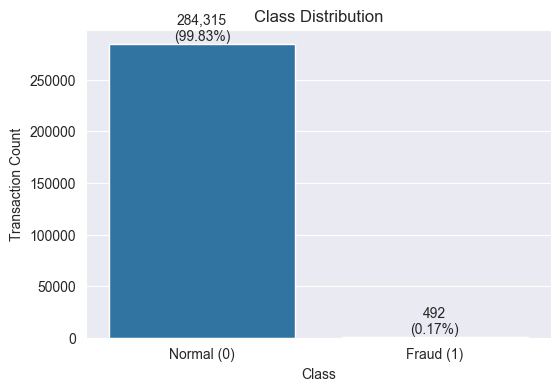

In [7]:
# class 비율
class_counts = data['Class'].value_counts()
total = len(data)

plt.figure(figsize=(6,4))
sns.countplot(data=data, x='Class')
plt.title('Class Distribution')
plt.xticks([0,1], ['Normal (0)', 'Fraud (1)'])
plt.ylabel('Transaction Count')

for i, (label, count) in enumerate(class_counts.items()):
    percent = count / total * 100
    plt.text(i, count + 1000, f'{count:,}\n({percent:.2f}%)', ha='center', va='bottom', fontsize=10)

# plt.ylim(0, class_counts[0] + 5000) # y축 여유 공간(?)
plt.show()

[Amount] 이상치 개수: 31904
[Time] 이상치 개수: 0


/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_90437/3841335637.py:31: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_90437/3841335637.py:31: UserWarning: Glyph 49345 (\N{HANGUL SYLLABLE SANG}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_90437/3841335637.py:31: UserWarning: Glyph 52824 (\N{HANGUL SYLLABLE CI}) missing from font(s) Arial.
  plt.tight_layout()
/Users/yun-iseo/miniconda3/envs/ai_basic_env/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yun-iseo/miniconda3/envs/ai_basic_env/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 49345 (\N{HANGUL SYLLABLE SANG}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


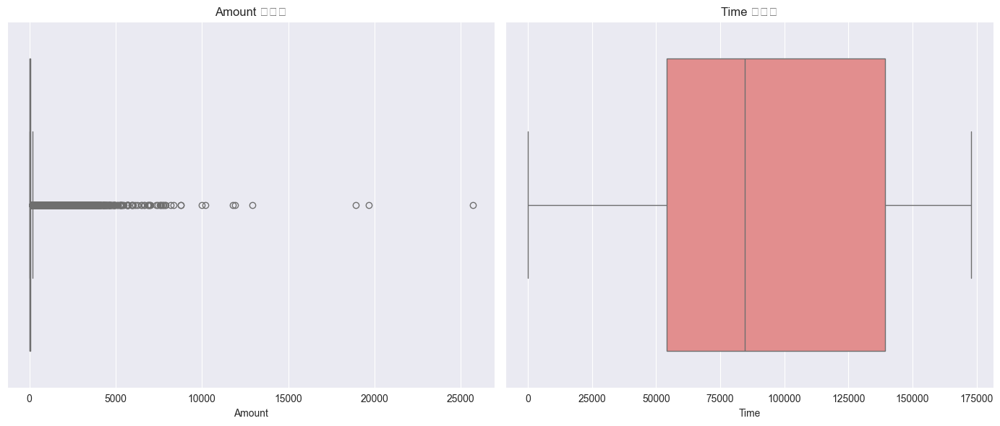

In [8]:
# 이상치 탐색
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

# Amount 이상치 탐색
amount_outliers, amount_low, amount_up = detect_outliers_iqr(data, 'Amount')
print(f"[Amount] 이상치 개수: {len(amount_outliers)}")

# Time 이상치 탐색
time_outliers, time_low, time_up = detect_outliers_iqr(data, 'Time')
print(f"[Time] 이상치 개수: {len(time_outliers)}")

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x=data['Amount'], color='skyblue')
plt.title('Amount 이상치')
plt.xlabel('Amount')

plt.subplot(1, 2, 2)
sns.boxplot(x=data['Time'], color='lightcoral')
plt.title('Time 이상치')
plt.xlabel('Time')

plt.tight_layout()
plt.show()

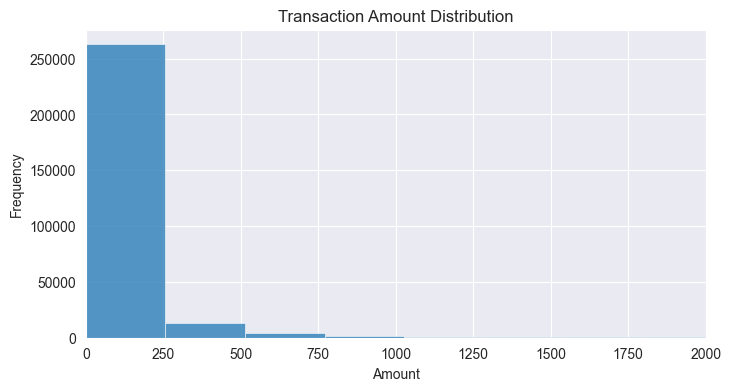

In [9]:
# Amount 분포
plt.figure(figsize=(8,4))
sns.histplot(data['Amount'], bins=100, kde=False)

bin_counts, bin_edges = np.histogram(data['Amount'], bins=100)
total = len(data)

plt.title('Transaction Amount Distribution')
plt.xlabel('Amount')
plt.ylabel('Frequency')
plt.xlim(0, 2000) # 극단값 제외
plt.show()

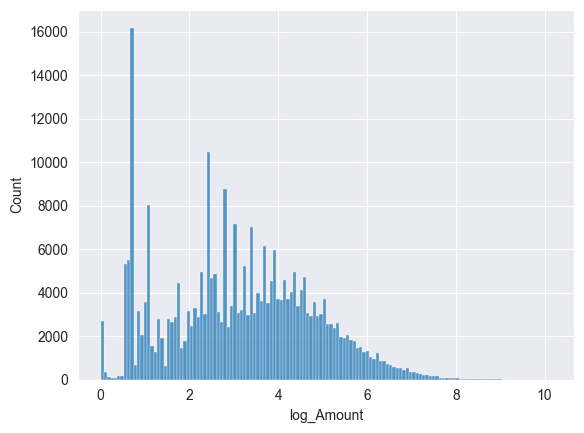

In [10]:
# Amount 로그 변환 (0값이 포함되어 있으므로 np.log1p() 사용)
data['log_Amount'] = data['Amount'].apply(lambda x: np.log1p(x))
sns.histplot(data=data, x='log_Amount')
plt.show()

[log_Amount] 이상치 개수: 245
[Time] 이상치 개수: 0


/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_90437/299303057.py:31: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_90437/299303057.py:31: UserWarning: Glyph 49345 (\N{HANGUL SYLLABLE SANG}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_90437/299303057.py:31: UserWarning: Glyph 52824 (\N{HANGUL SYLLABLE CI}) missing from font(s) Arial.
  plt.tight_layout()
/Users/yun-iseo/miniconda3/envs/ai_basic_env/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yun-iseo/miniconda3/envs/ai_basic_env/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 49345 (\N{HANGUL SYLLABLE SANG}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
/Us

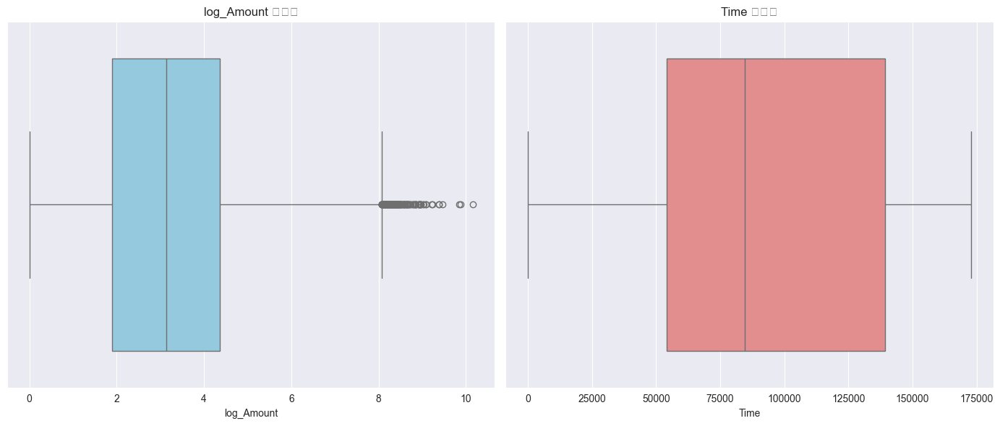

In [11]:
# 이상치 탐색
# def detect_outliers_iqr(data, column):
#     Q1 = data[column].quantile(0.25)
#     Q3 = data[column].quantile(0.75)
#     IQR = Q3 - Q1
#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR
#     outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
#     return outliers, lower_bound, upper_bound

# Amount 이상치 탐색
log_amount_outliers, log_amount_low, log_amount_up = detect_outliers_iqr(data, 'log_Amount')
print(f"[log_Amount] 이상치 개수: {len(log_amount_outliers)}")

# Time 이상치 탐색
time_outliers, time_low, time_up = detect_outliers_iqr(data, 'Time')
print(f"[Time] 이상치 개수: {len(time_outliers)}")

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x=data['log_Amount'], color='skyblue')
plt.title('log_Amount 이상치')
plt.xlabel('log_Amount')

plt.subplot(1, 2, 2)
sns.boxplot(x=data['Time'], color='lightcoral')
plt.title('Time 이상치')
plt.xlabel('Time')

plt.tight_layout()
plt.show()

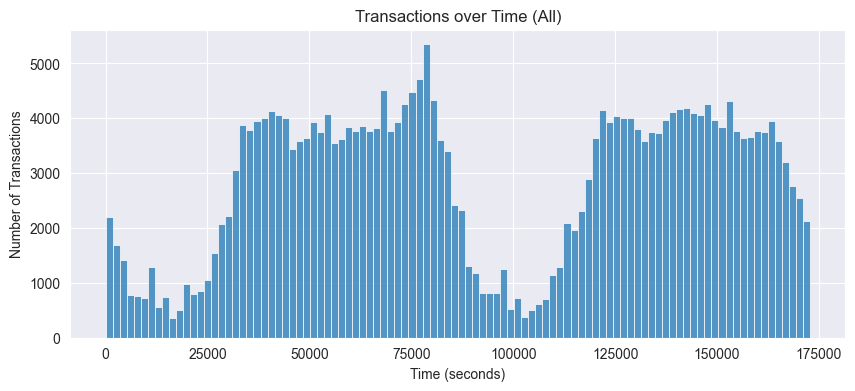

In [12]:
# Time 분포
plt.figure(figsize=(10,4))
sns.histplot(data['Time'], bins=100, kde=False)
plt.title('Transactions over Time (All)')
plt.xlabel('Time (seconds)')
plt.ylabel('Number of Transactions')
plt.show()

In [13]:
# Time 시간대 파생변수
data['Hour'] = (data['Time'] // 3600) % 24

data[['Hour']].describe()

,Hour
count,284807.000000
mean,14.046470
std,5.835854
min,0.000000
25%,10.000000
50%,15.000000
75%,19.000000
max,23.000000


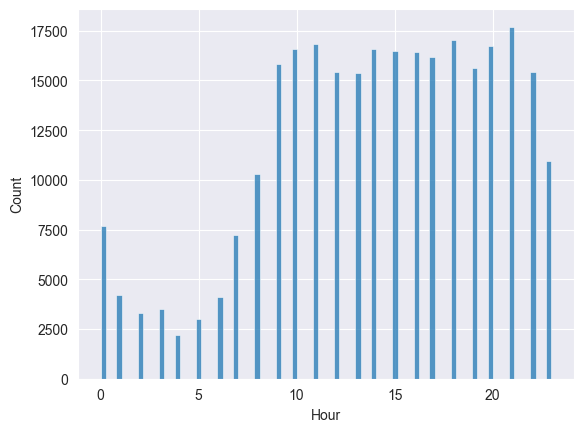

In [14]:
# Time 시간대 분포
sns.histplot(data=data, x='Hour')
plt.show()

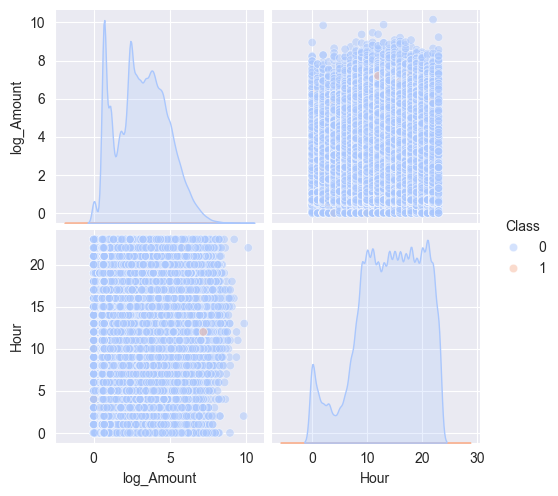

In [15]:
# Class와 모든 변수 간 관계
columns_to_plot = ['log_Amount', 'Hour']

sns.pairplot(data[columns_to_plot + ['Class']], hue='Class', palette='coolwarm', plot_kws={'alpha': 0.5})

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 33 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Time        284807 non-null  float64
 1   V1          284807 non-null  float64
 2   V2          284807 non-null  float64
 3   V3          284807 non-null  float64
 4   V4          284807 non-null  float64
 5   V5          284807 non-null  float64
 6   V6          284807 non-null  float64
 7   V7          284807 non-null  float64
 8   V8          284807 non-null  float64
 9   V9          284807 non-null  float64
 10  V10         284807 non-null  float64
 11  V11         284807 non-null  float64
 12  V12         284807 non-null  float64
 13  V13         284807 non-null  float64
 14  V14         284807 non-null  float64
 15  V15         284807 non-null  float64
 16  V16         284807 non-null  float64
 17  V17         284807 non-null  float64
 18  V18         284807 non-null  float64
 19  V1

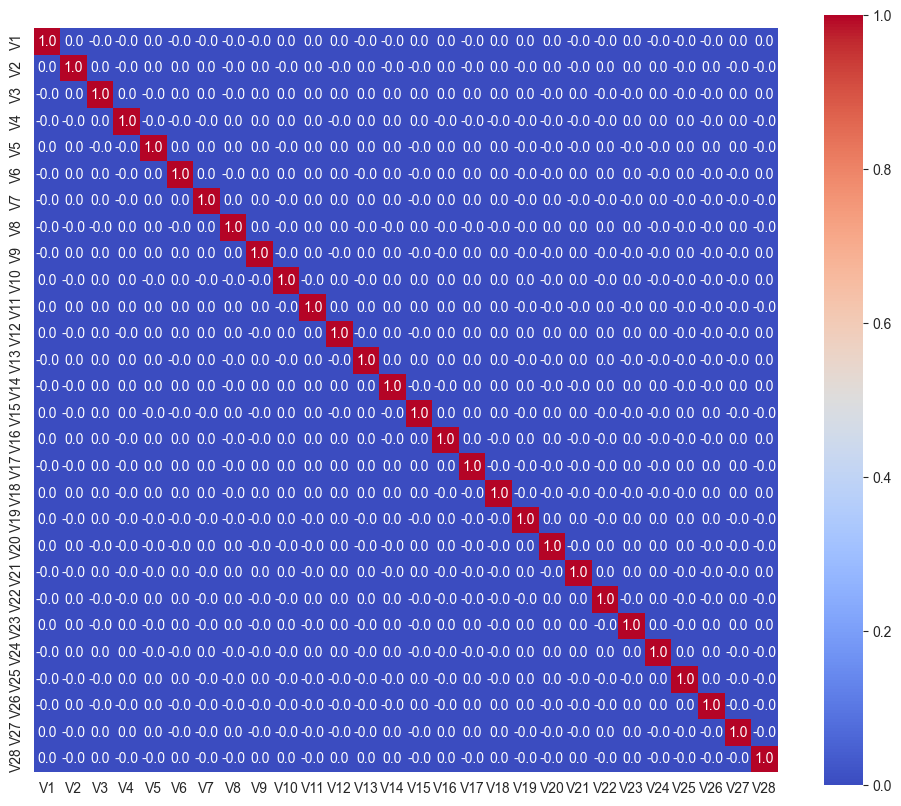

In [17]:
# V1~V28 간 상관관계
corr_matrix = data.iloc[:, 1:29].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt='.1f', cmap='coolwarm', cbar=True, square=True)
plt.show()

In [18]:
corr_mat = data.corr(numeric_only=True)
corr_mat

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V23,V24,V25,V26,V27,V28,Amount,Class,log_Amount,Hour
Time,1.000000,1.173963e-01,-1.059333e-02,-4.196182e-01,-1.052602e-01,1.730721e-01,-6.301647e-02,8.471437e-02,-3.694943e-02,-8.660434e-03,...,5.114236e-02,-1.618187e-02,-2.330828e-01,-4.140710e-02,-5.134591e-03,-9.412688e-03,-0.010596,-0.012323,-0.028515,0.415575
V1,0.117396,1.000000e+00,4.188326e-16,-1.164018e-15,-9.082889e-16,2.085924e-17,-6.343731e-16,-1.018099e-15,-2.557889e-16,-1.347621e-16,...,6.217312e-16,-4.385333e-17,-9.832396e-16,-1.745526e-17,1.196577e-16,2.108702e-15,-0.227709,-0.101347,-0.096375,-0.005214
V2,-0.010593,4.188326e-16,1.000000e+00,3.140164e-16,-1.125909e-15,5.230686e-16,2.781752e-16,1.857398e-16,-5.698764e-17,2.006267e-17,...,1.668081e-16,1.577058e-17,-4.530958e-16,1.984817e-16,-4.938067e-16,-5.182198e-16,-0.531409,0.091289,-0.450317,0.007802
V3,-0.419618,-1.164018e-15,3.140164e-16,1.000000e+00,4.644369e-16,-5.483554e-17,1.627805e-15,5.239200e-16,-1.297365e-15,5.725902e-16,...,-5.063673e-16,5.605700e-19,-1.118857e-15,-1.389572e-16,1.058098e-15,9.792787e-16,-0.210880,-0.192961,-0.033913,-0.021569
V4,-0.105260,-9.082889e-16,-1.125909e-15,4.644369e-16,1.000000e+00,-1.722056e-15,-7.565957e-16,-4.188169e-16,5.645256e-16,6.873528e-16,...,9.564529e-17,1.569977e-16,6.026069e-16,-4.237973e-16,4.577343e-17,-3.888959e-18,0.098732,0.133447,-0.004677,-0.035063
V5,0.173072,2.085924e-17,5.230686e-16,-5.483554e-17,-1.722056e-15,1.000000e+00,2.208263e-16,2.691713e-16,7.396815e-16,7.178142e-16,...,-8.760100e-18,-1.142295e-15,5.021165e-16,4.450164e-16,6.538203e-16,-3.301835e-18,-0.386356,-0.094974,-0.286189,-0.035134
V6,-0.063016,-6.343731e-16,2.781752e-16,1.627805e-15,-7.565957e-16,2.208263e-16,1.000000e+00,1.213776e-16,-1.030439e-16,4.234240e-16,...,9.443837e-17,-1.070899e-15,4.568884e-16,-1.402561e-16,-4.500879e-16,2.493919e-16,0.215981,-0.043643,0.163822,-0.018945
V7,0.084714,-1.018099e-15,1.857398e-16,5.239200e-16,-4.188169e-16,2.691713e-16,1.213776e-16,1.000000e+00,3.549393e-16,1.125386e-15,...,-4.458969e-16,9.812896e-18,-2.881866e-16,-9.494990e-16,-1.723845e-15,-2.921030e-16,0.397311,-0.187257,0.095758,-0.009729
V8,-0.036949,-2.557889e-16,-5.698764e-17,-1.297365e-15,5.645256e-16,7.396815e-16,-1.030439e-16,3.549393e-16,1.000000e+00,4.340695e-16,...,6.910016e-17,-9.701203e-17,-4.609097e-16,-1.777597e-16,1.280491e-16,-6.187506e-16,-0.103079,0.019875,-0.020690,0.032106
V9,-0.008660,-1.347621e-16,2.006267e-17,5.725902e-16,6.873528e-16,7.178142e-16,4.234240e-16,1.125386e-15,4.340695e-16,1.000000e+00,...,-5.221067e-16,-1.449529e-16,6.679328e-16,-8.154251e-16,-6.111140e-17,1.106537e-15,-0.044246,-0.097733,-0.080498,-0.189830


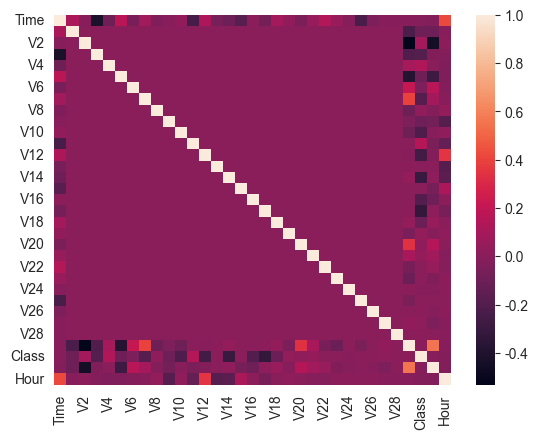

In [19]:
sns.heatmap(corr_mat, annot=False, fmt='.2f')
plt.show()

ValueError: '__' is not a valid value for ls; supported values are '-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'

/Users/yun-iseo/miniconda3/envs/ai_basic_env/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from font(s) Arial.
  func(*args, **kwargs)
/Users/yun-iseo/miniconda3/envs/ai_basic_env/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from font(s) Arial.
  func(*args, **kwargs)
/Users/yun-iseo/miniconda3/envs/ai_basic_env/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Glyph 45824 (\N{HANGUL SYLLABLE DAE}) missing from font(s) Arial.
  func(*args, **kwargs)
/Users/yun-iseo/miniconda3/envs/ai_basic_env/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Glyph 48324 (\N{HANGUL SYLLABLE BYEOL}) missing from font(s) Arial.
  func(*args, **kwargs)
/Users/yun-iseo/miniconda3/envs/ai_basic_env/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from font(s) Arial.
  fu

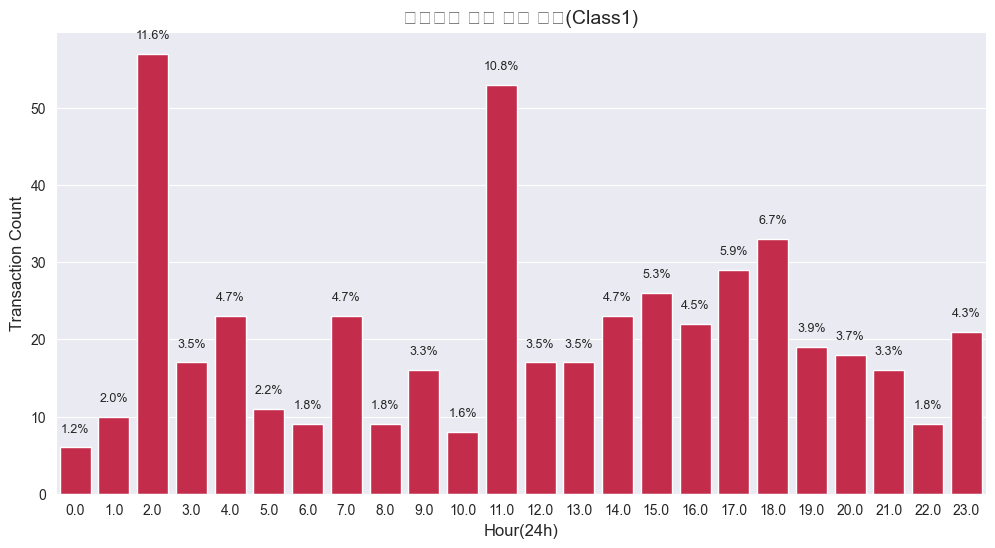

In [20]:
# 사기 거래 건수 : 새벽 2시, 오전 11시
fraud_df = data[data['Class'] == 1]

hour_counts = fraud_df['Hour'].value_counts().sort_index()
total_fraud = len(fraud_df)

plt.figure(figsize=(12,6))
ax = sns.countplot(data=fraud_df, x='Hour', color='crimson', order=sorted(fraud_df['Hour'].unique()))

for p in ax.patches:
    height = p.get_height()
    ratio = height / total_fraud * 100
    ax.text(p.get_x() + p.get_width()/2., height + 2, f'{ratio:.1f}%', ha='center', fontsize=9)

plt.title('시간대별 사기 거래 건수(Class1)', fontsize=14)
plt.xlabel('Hour(24h)', fontsize=12)
plt.ylabel('Transaction Count', fontsize=12)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='__', alpha=0.5)
plt.show()

In [57]:
fraud_df['Amount'].describe()

count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64

In [59]:
# amount 범위 구간 설정
bins = [0, 1, 10, 50, 100, 500, 1000, 1500, 2000, 2500]
labels = ['0-1', '1-10', '10-50', '50-100', '100-500', '500-1k', '1k-1.5k', '1.5k-2k', '2k-2.5k']
fraud_df['Amount_bin'] = pd.cut(fraud_df['Amount'], bins=bins, labels=labels)

/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_81707/2259663823.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fraud_df['Amount_bin'] = pd.cut(fraud_df['Amount'], bins=bins, labels=labels)


/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_81707/3802212254.py:14: UserWarning: Glyph 44144 (\N{HANGUL SYLLABLE GEO}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_81707/3802212254.py:14: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_81707/3802212254.py:14: UserWarning: Glyph 44552 (\N{HANGUL SYLLABLE GEUM}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_81707/3802212254.py:14: UserWarning: Glyph 50529 (\N{HANGUL SYLLABLE AEG}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_81707/3802212254.py:14: UserWarning: Glyph 48276 (\N{HANGUL SYLLABLE BEOM}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_81707/3802212254.py:14: 

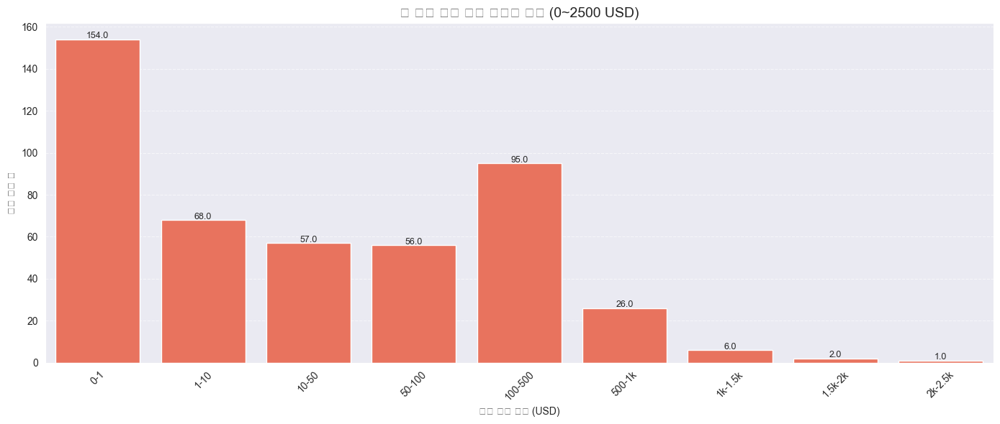

In [60]:
# 대부분 소액 거래
plt.figure(figsize=(14,6))
ax = sns.countplot(data=fraud_df, x='Amount_bin', color='tomato')

# 막대 위에 숫자 표시
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width()/2, height + 0.5, f'{height}', ha='center', fontsize=9)

plt.title('💳 사기 거래 금액 구간별 빈도 (0~2500 USD)', fontsize=14)
plt.xlabel('거래 금액 범위 (USD)')
plt.ylabel('사기 거래 수')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 중국 수질 데이터셋

In [3]:
cwp_df = pd.read_csv('data/china_water_pollution_data.csv')
cwp_df.head()

,Province,City,Monitoring_Station,Latitude,Longitude,Date,Water_Temperature_C,pH,Dissolved_Oxygen_mg_L,Conductivity_uS_cm,...,Total_Nitrogen_mg_L,COD_mg_L,BOD_mg_L,Heavy_Metals_Pb_ug_L,Heavy_Metals_Cd_ug_L,Heavy_Metals_Hg_ug_L,Coliform_Count_CFU_100mL,Water_Quality_Index,Pollution_Level,Remarks
0,Zhejiang,Ningbo,Ningbo_Station_2,25.523836,122.622036,2023-06-01,22.48,6.93,9.30,652.30,...,2.71,15.38,1.39,6.90,0.66,0.02,87,36.64,Very Poor,High pollution spike detected
1,Sichuan,Mianyang,Mianyang_Station_1,32.243099,112.888760,2023-03-05,27.33,6.89,8.14,357.53,...,3.15,16.82,2.98,4.68,0.39,0.10,116,66.25,Excellent,High pollution spike detected
2,Zhejiang,Ningbo,Ningbo_Station_8,29.996179,124.744859,2023-07-13,21.04,6.02,5.34,519.69,...,3.39,17.31,2.65,3.24,0.27,0.11,110,98.69,Poor,High pollution spike detected
3,Beijing,Beijing,Beijing_Station_10,29.976437,118.274846,2023-02-17,16.62,7.31,10.06,593.13,...,2.91,17.95,5.18,3.20,0.67,0.11,99,71.32,Poor,Monitoring recommended
4,Sichuan,Chengdu,Chengdu_Station_1,43.524720,121.666111,2023-03-06,21.81,7.77,7.93,656.46,...,3.45,20.10,3.47,2.01,0.34,0.14,82,16.12,Excellent,NaN


In [4]:
cwp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Province                  3000 non-null   object 
 1   City                      3000 non-null   object 
 2   Monitoring_Station        3000 non-null   object 
 3   Latitude                  3000 non-null   float64
 4   Longitude                 3000 non-null   float64
 5   Date                      3000 non-null   object 
 6   Water_Temperature_C       3000 non-null   float64
 7   pH                        3000 non-null   float64
 8   Dissolved_Oxygen_mg_L     3000 non-null   float64
 9   Conductivity_uS_cm        3000 non-null   float64
 10  Turbidity_NTU             3000 non-null   float64
 11  Nitrate_mg_L              3000 non-null   float64
 12  Nitrite_mg_L              3000 non-null   float64
 13  Ammonia_N_mg_L            3000 non-null   float64
 14  Total_Ph

In [5]:
cwp_df.describe()

,Latitude,Longitude,Water_Temperature_C,pH,Dissolved_Oxygen_mg_L,Conductivity_uS_cm,Turbidity_NTU,Nitrate_mg_L,Nitrite_mg_L,Ammonia_N_mg_L,Total_Phosphorus_mg_L,Total_Nitrogen_mg_L,COD_mg_L,BOD_mg_L,Heavy_Metals_Pb_ug_L,Heavy_Metals_Cd_ug_L,Heavy_Metals_Hg_ug_L,Coliform_Count_CFU_100mL,Water_Quality_Index
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,32.297496,112.546009,20.051253,7.030207,8.006700,496.558537,4.948190,1.982910,0.019961,0.501583,0.100898,3.007363,19.989780,4.014560,4.978943,0.500730,0.099420,99.997333,50.262903
std,7.222235,7.240150,4.923307,0.496628,1.974517,98.874604,4.910484,0.507882,0.009926,0.200057,0.050109,0.498326,5.008402,1.005858,2.017430,0.197278,0.049419,9.992127,29.105637
min,20.014474,100.017169,3.390000,5.340000,1.470000,136.850000,0.000000,0.230000,-0.020000,-0.310000,-0.088000,1.270000,2.090000,0.680000,-2.940000,-0.120000,-0.070000,69.000000,0.000000
25%,25.987589,106.261698,16.710000,6.700000,6.657500,430.245000,1.430000,1.630000,0.013000,0.360000,0.066000,2.660000,16.587500,3.310000,3.620000,0.370000,0.070000,93.000000,24.602500
50%,32.291070,112.440333,19.980000,7.020000,8.030000,496.315000,3.445000,1.980000,0.020000,0.500000,0.102000,3.010000,19.940000,4.030000,4.985000,0.500000,0.100000,100.000000,50.600000
75%,38.526466,118.964792,23.312500,7.360000,9.352500,561.282500,6.932500,2.320000,0.027000,0.640000,0.137000,3.340000,23.360000,4.710000,6.330000,0.630000,0.130000,107.000000,75.095000
max,44.995192,124.995576,36.770000,8.760000,14.490000,842.890000,47.480000,3.840000,0.053000,1.130000,0.274000,4.700000,37.780000,6.970000,12.610000,1.300000,0.240000,136.000000,99.950000


In [6]:
cwp_df['City'].unique()

array(['Ningbo', 'Mianyang', 'Beijing', 'Chengdu', 'Dali', 'Nanjing',
       'Jinan', 'Qingdao', 'Luoyang', 'Hangzhou', 'Yichang', 'Shenzhen',
       'Guangzhou', 'Zhengzhou', 'Kunming', 'Shanghai', 'Suzhou', 'Wuhan'],
      dtype=object)

In [7]:
levels = {
    'Very Poor': 1,
    'Poor': 2,
    'Moderate': 3,
    'Good': 4,
    'Excellent': 5
}

cwp_df['Pollution_Level'] = cwp_df['Pollution_Level'].map(levels)

In [8]:
cwp_df['Pollution_Level'].value_counts()

Pollution_Level
4    622
1    609
5    594
3    588
2    587
Name: count, dtype: int64

In [9]:
level = cwp_df['Pollution_Level'].value_counts()
level

Pollution_Level
4    622
1    609
5    594
3    588
2    587
Name: count, dtype: int64

In [10]:
cwp_df.head()

,Province,City,Monitoring_Station,Latitude,Longitude,Date,Water_Temperature_C,pH,Dissolved_Oxygen_mg_L,Conductivity_uS_cm,...,Total_Nitrogen_mg_L,COD_mg_L,BOD_mg_L,Heavy_Metals_Pb_ug_L,Heavy_Metals_Cd_ug_L,Heavy_Metals_Hg_ug_L,Coliform_Count_CFU_100mL,Water_Quality_Index,Pollution_Level,Remarks
0,Zhejiang,Ningbo,Ningbo_Station_2,25.523836,122.622036,2023-06-01,22.48,6.93,9.30,652.30,...,2.71,15.38,1.39,6.90,0.66,0.02,87,36.64,1,High pollution spike detected
1,Sichuan,Mianyang,Mianyang_Station_1,32.243099,112.888760,2023-03-05,27.33,6.89,8.14,357.53,...,3.15,16.82,2.98,4.68,0.39,0.10,116,66.25,5,High pollution spike detected
2,Zhejiang,Ningbo,Ningbo_Station_8,29.996179,124.744859,2023-07-13,21.04,6.02,5.34,519.69,...,3.39,17.31,2.65,3.24,0.27,0.11,110,98.69,2,High pollution spike detected
3,Beijing,Beijing,Beijing_Station_10,29.976437,118.274846,2023-02-17,16.62,7.31,10.06,593.13,...,2.91,17.95,5.18,3.20,0.67,0.11,99,71.32,2,Monitoring recommended
4,Sichuan,Chengdu,Chengdu_Station_1,43.524720,121.666111,2023-03-06,21.81,7.77,7.93,656.46,...,3.45,20.10,3.47,2.01,0.34,0.14,82,16.12,5,NaN


# Pollution level
- Lowest(very poor) : Guangdong >  Shenzhen
- Highest(Excellent) : Jiangsu > Suzhou

In [12]:
province_pollution_avg = cwp_df.groupby('Province')['Pollution_Level'].mean().reset_index()

province_pollution_avg = province_pollution_avg.sort_values(by='Pollution_Level', ascending=False)
province_pollution_avg

,Province,Pollution_Level
4,Jiangsu,3.160410
7,Sichuan,3.064309
9,Zhejiang,3.049342
6,Shanghai,3.025641
3,Hubei,2.993151
0,Beijing,2.986622
8,Yunnan,2.986486
2,Henan,2.982877
5,Shandong,2.903333
1,Guangdong,2.863787


In [29]:
# City별 Pollution_Level 평균 계산
city_pollution_avg = cwp_df.groupby('City')['Pollution_Level'].transform('mean')

# pollution_level_avg 컬럼으로 추가
cwp_df['pollution_level_avg'] = city_pollution_avg

In [14]:
# 1. 전체 평균 Pollution_Level 계산
overall_pollution_mean = cwp_df['Pollution_Level'].mean()

# 2. 비교하여 WQI_group 컬럼 생성
def assign_wqi_group(row):
    if row['pollution_level_avg'] > overall_pollution_mean:
        return 'H'
    elif row['pollution_level_avg'] < overall_pollution_mean:
        return 'L'
    else:
        return 'M'

# 3. cwp_df에 적용
cwp_df['WQI_group'] = cwp_df.apply(assign_wqi_group, axis=1)
cwp_df.groupby('WQI_group')['City'].nunique()

WQI_group
H     8
L    10
Name: City, dtype: int64

In [15]:
cwp_df['City'].nunique()

18

In [31]:
cwp_df[cwp_df['WQI_group']=='H']['City'].unique()

array(['Mianyang', 'Chengdu', 'Nanjing', 'Luoyang', 'Hangzhou', 'Yichang',
       'Shanghai', 'Suzhou'], dtype=object)

In [32]:
cwp_df[cwp_df['WQI_group']=='L']['City'].unique()

array(['Ningbo', 'Beijing', 'Dali', 'Jinan', 'Qingdao', 'Shenzhen',
       'Guangzhou', 'Zhengzhou', 'Kunming', 'Wuhan'], dtype=object)

In [16]:
# City별 Pollution_Level 평균 계산
city_pollution_avg = cwp_df.groupby('City')['Pollution_Level'].mean().reset_index()

# 평균이 3보다 높은 City
high_pollution_cities = city_pollution_avg[city_pollution_avg['Pollution_Level'] > 3.00]

# 평균이 3보다 낮은 City
low_pollution_cities = city_pollution_avg[city_pollution_avg['Pollution_Level'] < 3.00]

# 결과 출력
print("Pollution_Level 평균이 3보다 높은 도시:")
print(high_pollution_cities)

print("\nPollution_Level 평균이 3보다 낮은 도시:")
print(low_pollution_cities)

Pollution_Level 평균이 3보다 높은 도시:
        City  Pollution_Level
1    Chengdu         3.115152
4   Hangzhou         3.189189
7    Luoyang         3.057971
8   Mianyang         3.006849
9    Nanjing         3.019608
12  Shanghai         3.025641
14    Suzhou         3.314286
16   Yichang         3.036232

Pollution_Level 평균이 3보다 낮은 도시:
         City  Pollution_Level
0     Beijing         2.986622
2        Dali         2.986111
3   Guangzhou         2.897260
5       Jinan         2.875000
6     Kunming         2.986842
10     Ningbo         2.916667
11    Qingdao         2.935714
13   Shenzhen         2.832258
15      Wuhan         2.954545
17  Zhengzhou         2.915584


In [17]:
# City별 Pollution_Level 평균 계산
city_pollution_avg = cwp_df.groupby('City')['Pollution_Level'].mean().reset_index()

def assign_level_group(pollution_level):
    if pollution_level > 3.00:
        return 'H'
    elif pollution_level < 3.00:
        return 'L'
    else:
        return 'M'  # Pollution_Level == 3

# cwp_df에 적용
cwp_df['level_group'] = cwp_df['Pollution_Level'].apply(assign_level_group)

# 결과 확인
cwp_df[cwp_df['level_group'] == 'M']

,Province,City,Monitoring_Station,Latitude,Longitude,Date,Water_Temperature_C,pH,Dissolved_Oxygen_mg_L,Conductivity_uS_cm,...,Heavy_Metals_Pb_ug_L,Heavy_Metals_Cd_ug_L,Heavy_Metals_Hg_ug_L,Coliform_Count_CFU_100mL,Water_Quality_Index,Pollution_Level,Remarks,pollution_level_avg,WQI_group,level_group
5,Zhejiang,Ningbo,Ningbo_Station_8,43.904780,101.988752,2023-07-29,24.58,7.16,6.94,551.33,...,4.42,-0.03,0.12,91,33.76,3,Requires attention,2.916667,L,M
9,Shandong,Jinan,Jinan_Station_4,36.336582,104.538140,2023-04-29,21.25,7.17,6.64,523.23,...,3.09,0.35,0.04,108,84.92,3,Monitoring recommended,2.875000,L,M
11,Shandong,Qingdao,Qingdao_Station_9,30.253306,114.157183,2023-12-28,22.37,6.96,6.31,348.52,...,3.38,0.71,0.10,107,70.25,3,Requires attention,2.935714,L,M
13,Henan,Luoyang,Luoyang_Station_6,32.368152,115.077808,2023-10-21,31.57,6.07,9.37,338.73,...,8.69,0.77,0.14,95,27.08,3,NaN,3.057971,H,M
16,Zhejiang,Ningbo,Ningbo_Station_9,28.245944,106.644102,2023-09-16,21.00,6.70,8.14,461.47,...,4.78,0.40,0.11,95,2.33,3,Monitoring recommended,2.916667,L,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2987,Shandong,Jinan,Jinan_Station_6,29.972242,123.748852,2023-05-22,15.50,7.53,9.93,420.40,...,8.89,0.34,0.13,101,54.87,3,High pollution spike detected,2.875000,L,M
2988,Beijing,Beijing,Beijing_Station_10,41.768131,106.381987,2023-10-20,10.20,6.64,9.67,794.36,...,6.85,0.67,0.09,88,69.78,3,NaN,2.986622,L,M
2990,Shanghai,Shanghai,Shanghai_Station_4,23.922342,106.917199,2023-04-22,23.67,7.40,2.96,455.17,...,6.08,0.46,0.16,113,16.81,3,Monitoring recommended,3.025641,H,M
2992,Henan,Luoyang,Luoyang_Station_6,43.219628,112.116586,2023-07-20,14.10,6.92,7.24,530.58,...,6.70,0.45,0.02,110,6.47,3,Requires attention,3.057971,H,M


In [18]:
# 1. 먼저 Date 컬럼을 datetime 형식으로 변환
cwp_df['Date'] = pd.to_datetime(cwp_df['Date'], errors='coerce')  # invalid date 처리 포함

# 2. Month 컬럼 생성 (문자열 형태 'YYYY-MM')
cwp_df['Month'] = cwp_df['Date'].dt.strftime('%Y-%m')

# 문자열 'YYYY-MM'을 datetime으로 변환
cwp_df['Month_dt'] = pd.to_datetime(cwp_df['Month'])

In [19]:
# 필요한 컬럼
columns_to_plot = [
    'Water_Temperature_C', 'pH', 'Dissolved_Oxygen_mg_L', 'Conductivity_uS_cm',
    'Turbidity_NTU', 'Nitrate_mg_L', 'Nitrite_mg_L', 'Ammonia_N_mg_L',
    'Total_Phosphorus_mg_L', 'Total_Nitrogen_mg_L', 'COD_mg_L', 'BOD_mg_L',
    'Heavy_Metals_Pb_ug_L', 'Heavy_Metals_Cd_ug_L', 'Heavy_Metals_Hg_ug_L',
    'Coliform_Count_CFU_100mL', 'Water_Quality_Index'
]

In [20]:
titles = [
    "수온", "수소이온농도", "용존산소", "전기전도도", "탁도", "질산염", "아질산염", "암모니아성 질소",
    "총인", "총질소", "화학적산소요구량", "생화학적산소요구량", "중금속납", "중금속카드뮴", "중금속수은",
    "대장균군수", "수질지수"
]

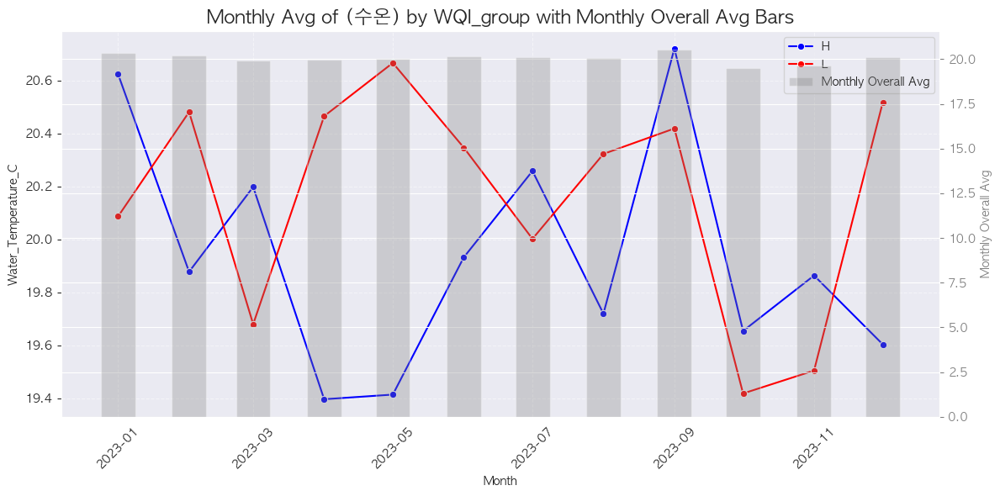

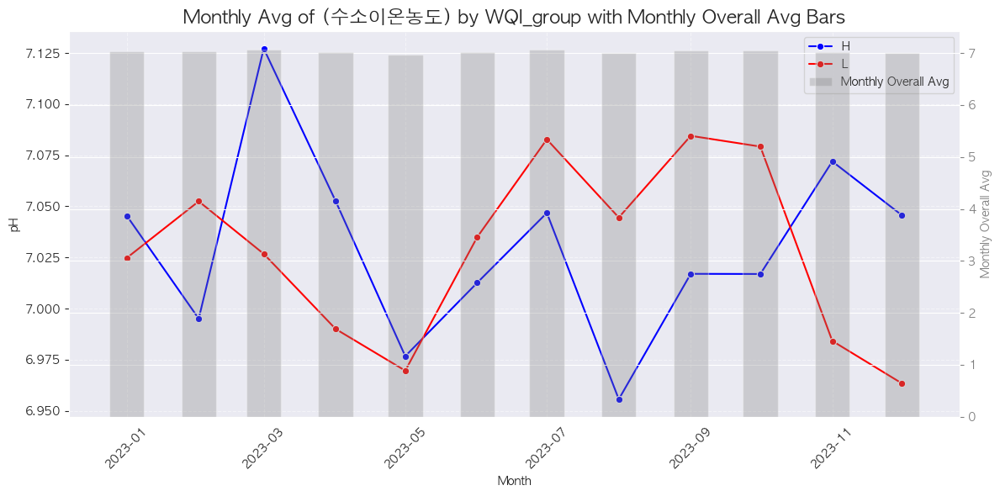

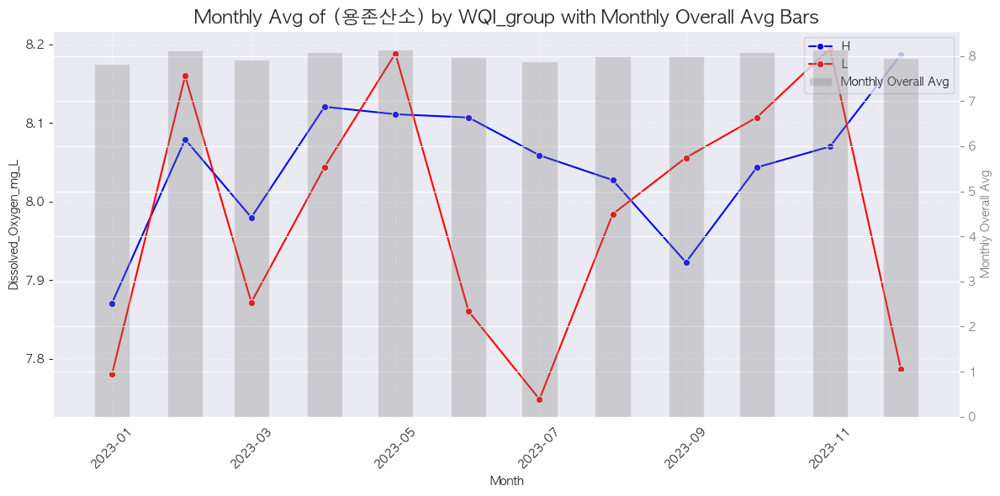

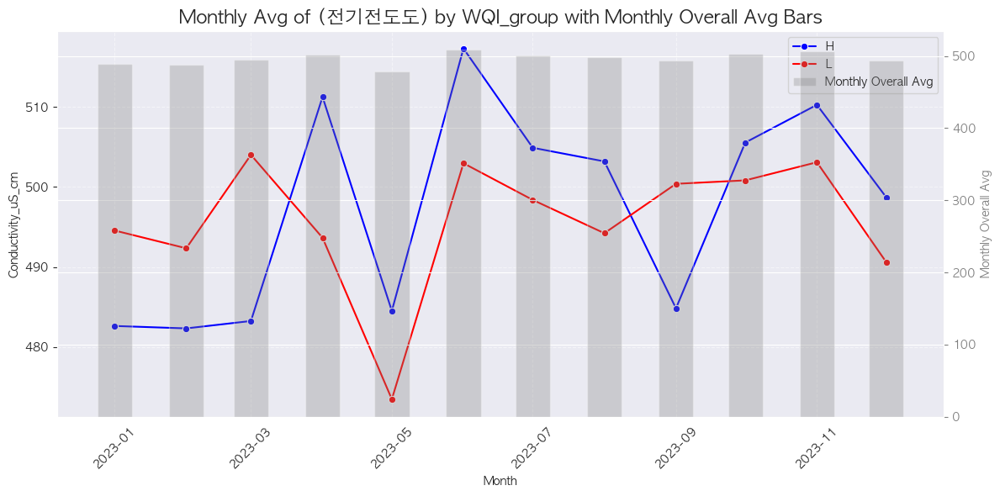

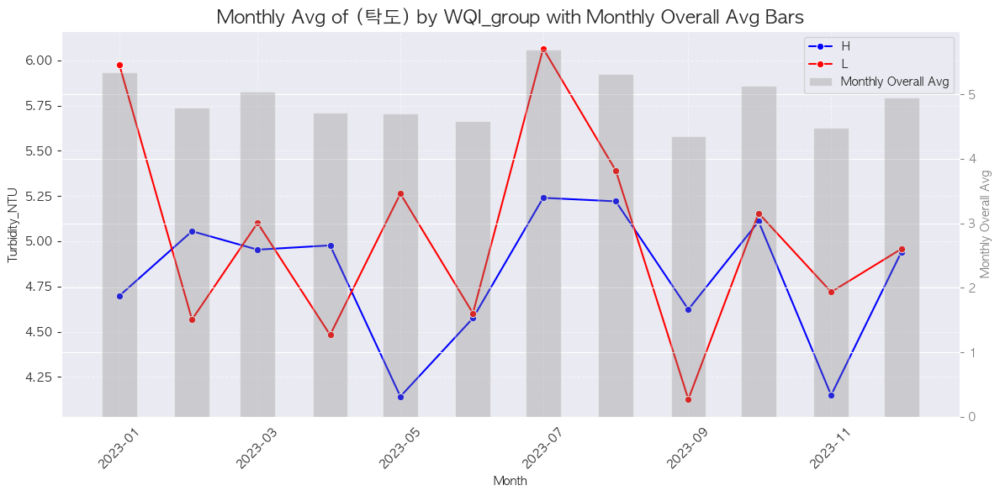

...

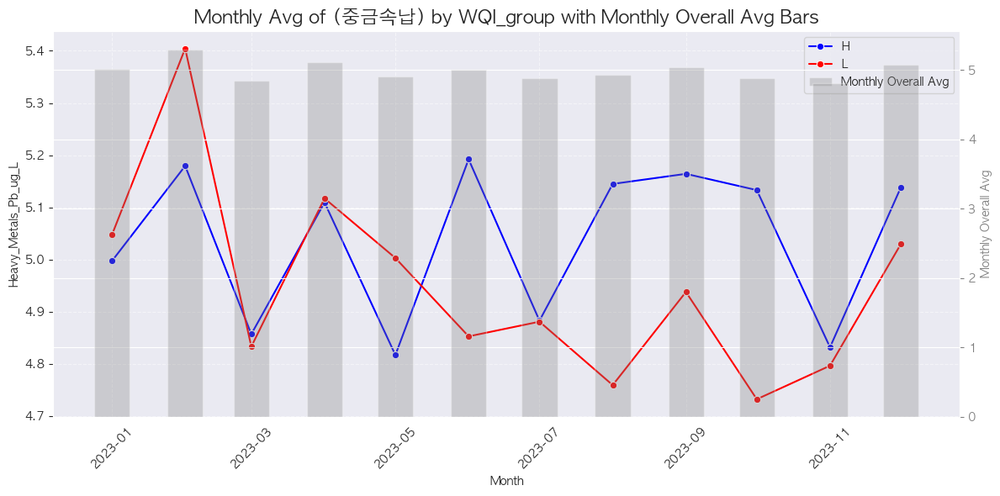

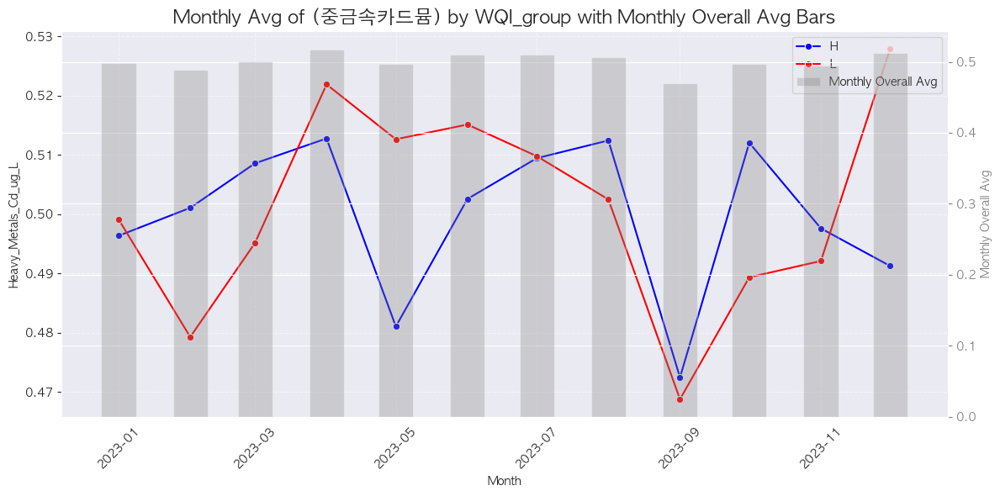

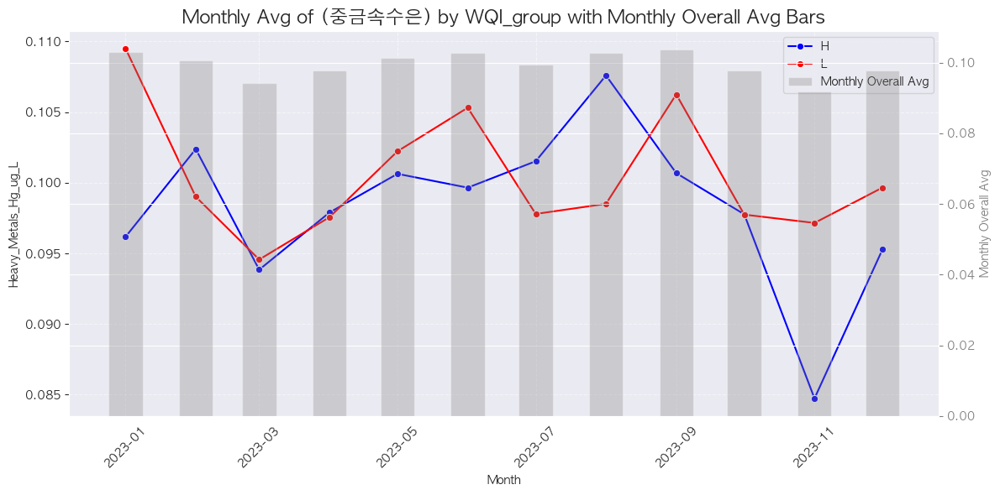

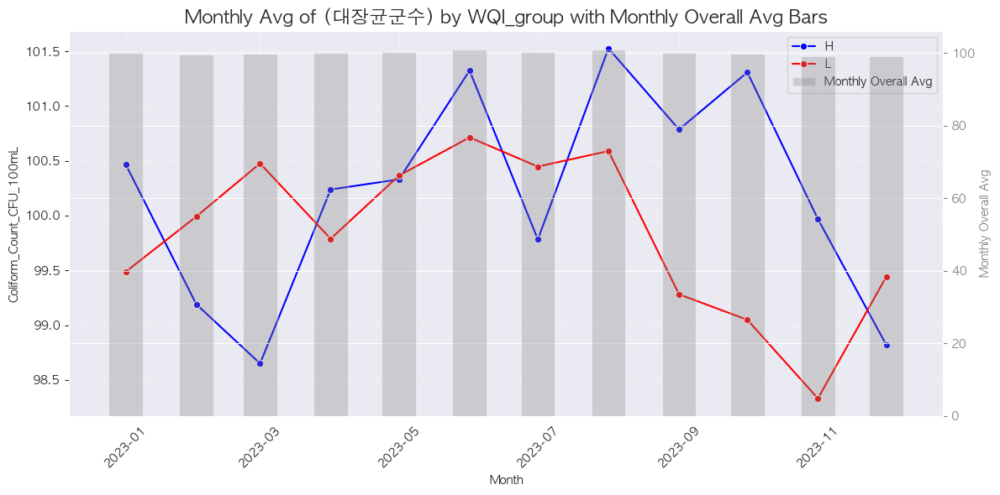

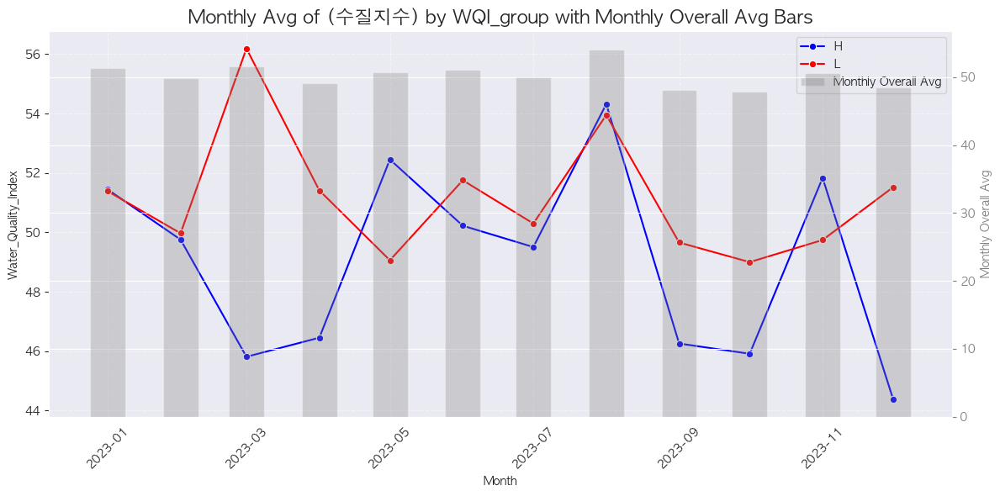

In [100]:
import matplotlib.dates as mdates

# 괄호 추가
titles_with_parentheses = [f"({t})" for t in titles]

# 그룹별 월별 평균
monthly_avg = cwp_df.groupby(['WQI_group', 'Month', 'Month_dt'])[columns_to_plot].mean().reset_index()

# 전체 월별 평균
monthly_overall_avg = cwp_df.groupby(['Month', 'Month_dt'])[columns_to_plot].mean().reset_index()

group_colors = {'H': 'blue', 'L': 'red', 'M': 'gray'}

for i, col in enumerate(columns_to_plot):
    plt.figure(figsize=(12, 6))

    # 라인플롯 (WQI_group별)
    ax1 = sns.lineplot(
        data=monthly_avg,
        x='Month_dt',
        y=col,
        hue='WQI_group',
        palette=group_colors,
        marker='o',
        errorbar=None
    )
    ax1.set_xlabel('Month')
    ax1.set_ylabel(col)
    ax1.set_title(f'Monthly Avg of {titles_with_parentheses[i]} by WQI_group with Monthly Overall Avg Bars', fontsize=16)
    ax1.grid(True, linestyle='--', alpha=0.5)
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.xticks(rotation=45)

    # 이중축 막대그래프 (월별 전체 평균)
    ax2 = ax1.twinx()
    ax2.bar(monthly_overall_avg['Month_dt'], monthly_overall_avg[col],
            color='gray', alpha=0.3, label='Monthly Overall Avg', width=15)
    ax2.set_ylabel('Monthly Overall Avg', color='gray')
    ax2.tick_params(axis='y', colors='gray')

    # 범례 병합
    h1, l1 = ax1.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax1.legend(h1 + h2, l1 + l2, loc='upper right')

    plt.tight_layout()
    plt.show()


## H-level

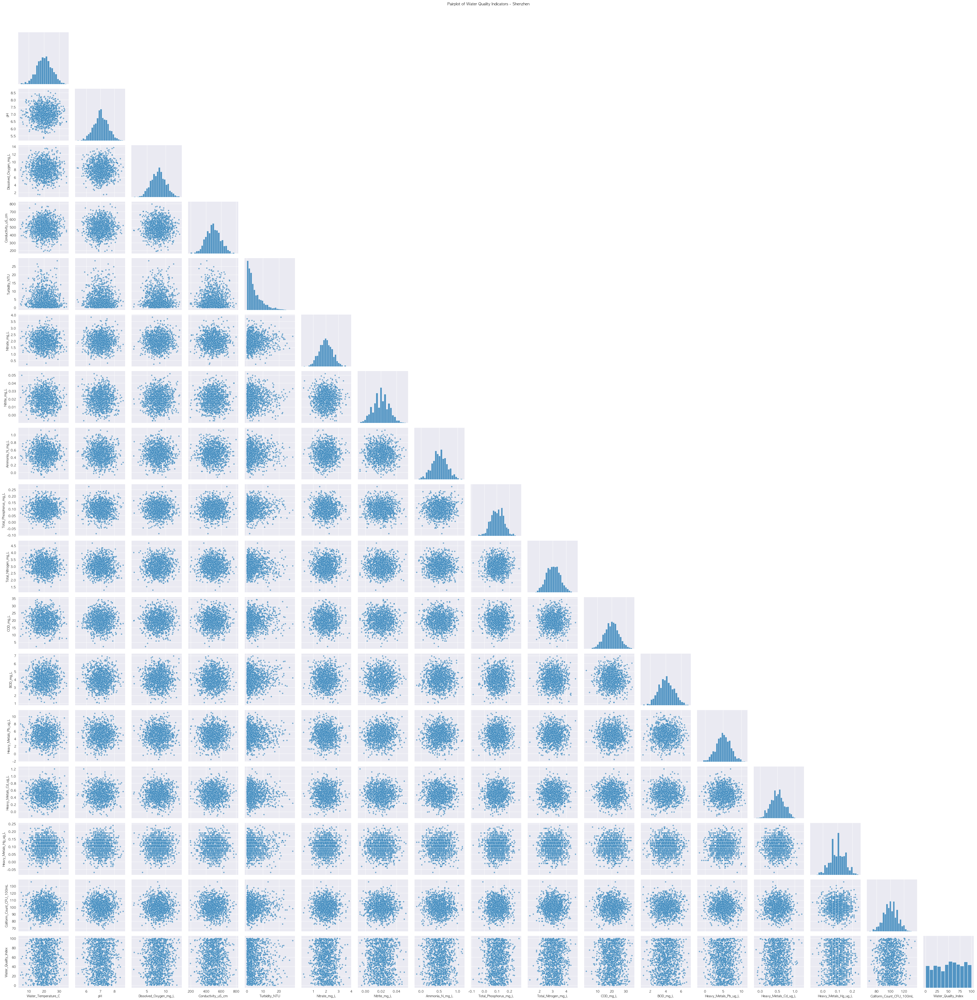

In [25]:
H_level_df = cwp_df[cwp_df['level_group'] == 'H'][columns_to_plot].dropna()

# pairplot 생성
sns.pairplot(
    data=H_level_df,
    corner=True,
    plot_kws={'alpha': 0.6, 's': 20}
)

plt.suptitle('Pairplot of Water Quality Indicators - Shenzhen', y=1.02)
plt.tight_layout()
plt.show()

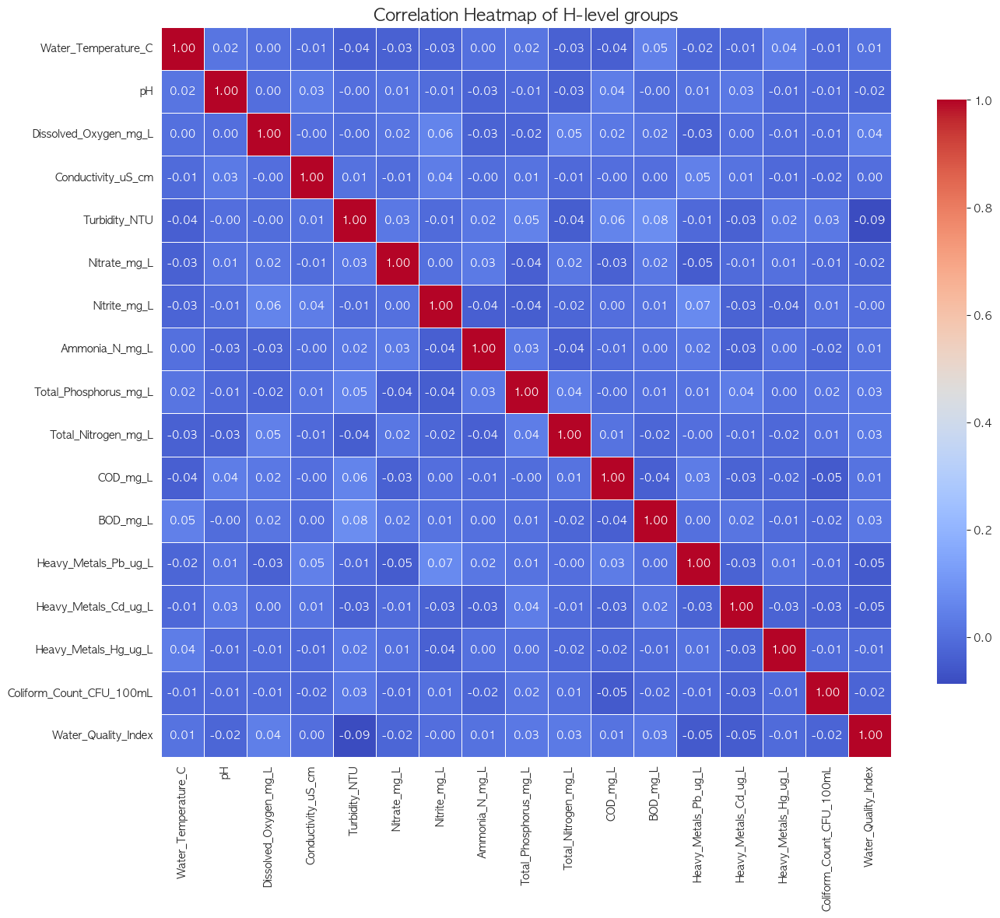

In [27]:
# 상관계수 계산
corr = H_level_df.corr()

# 히트맵 그리기
plt.figure(figsize=(14, 12))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=0.5, cbar_kws={"shrink": .75})
plt.title("Correlation Heatmap of H-level groups", fontsize=16)
plt.tight_layout()
plt.show()

## L-level

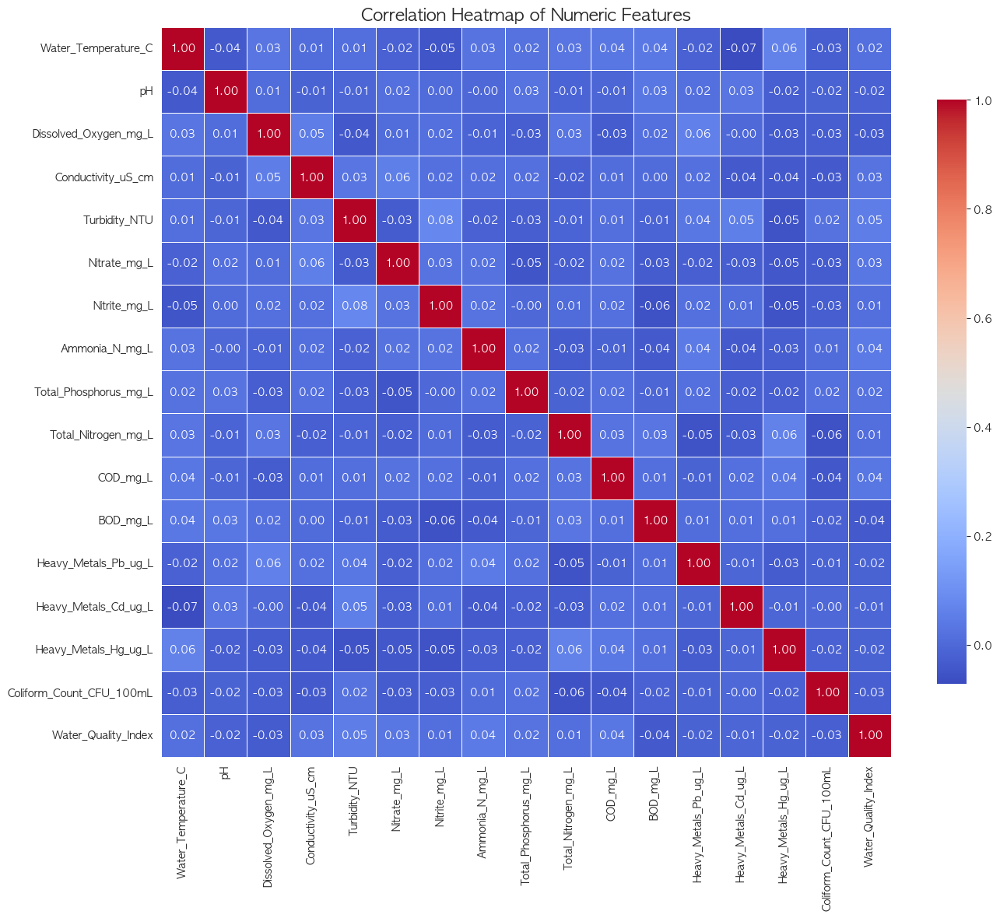

In [28]:
L_level_df = cwp_df[cwp_df['level_group'] == 'L'][columns_to_plot].dropna()

# 상관계수 계산
corr = L_level_df.corr()

# 히트맵 그리기
plt.figure(figsize=(14, 12))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=0.5, cbar_kws={"shrink": .75})
plt.title("Correlation Heatmap of Numeric Features", fontsize=16)
plt.tight_layout()
plt.show()

In [154]:
guangdong_cities = cwp_df[cwp_df['Province'] == 'Guangdong']['City'].unique()
print(guangdong_cities)

['Shenzhen' 'Guangzhou']


In [155]:
jiangsu_cities = cwp_df[cwp_df['Province'] == 'Jiangsu']['City'].unique()
print(jiangsu_cities)

['Nanjing' 'Suzhou']


In [156]:
cwp_df['Date'] = pd.to_datetime(cwp_df['Date'])  # 문자열 -> 날짜형으로 변환

cwp_df['Date'].describe() # 2023.1.1~2023.12.31

count                             3000
mean     2023-07-01 17:32:09.599999744
min                2023-01-01 00:00:00
25%                2023-04-03 00:00:00
50%                2023-07-03 00:00:00
75%                2023-09-29 00:00:00
max                2023-12-31 00:00:00
Name: Date, dtype: object

In [160]:
# 'Date' 컬럼을 datetime 형식으로 변환
cwp_df['Date'] = pd.to_datetime(cwp_df['Date'])

# 월별로 기간을 문자열로 변환
cwp_df['Month'] = cwp_df['Date'].dt.strftime('%Y-%m')
cwp_df.head()

,Province,City,Monitoring_Station,Latitude,Longitude,Date,Water_Temperature_C,pH,Dissolved_Oxygen_mg_L,Conductivity_uS_cm,...,Hangzhou,Yichang,Shenzhen,Guangzhou,Zhengzhou,Kunming,Shanghai,Suzhou,Wuhan,Month
0,Zhejiang,Ningbo,Ningbo_Station_2,25.523836,122.622036,2023-06-01,22.48,6.93,9.30,652.30,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-06
1,Sichuan,Mianyang,Mianyang_Station_1,32.243099,112.888760,2023-03-05,27.33,6.89,8.14,357.53,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-03
2,Zhejiang,Ningbo,Ningbo_Station_8,29.996179,124.744859,2023-07-13,21.04,6.02,5.34,519.69,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-07
3,Beijing,Beijing,Beijing_Station_10,29.976437,118.274846,2023-02-17,16.62,7.31,10.06,593.13,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-02
4,Sichuan,Chengdu,Chengdu_Station_1,43.524720,121.666111,2023-03-06,21.81,7.77,7.93,656.46,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-03


# Shenzhen

In [199]:
shenzhen = cwp_df[cwp_df['City'] == 'Shenzhen']
shenzhen

,Province,City,Monitoring_Station,Latitude,Longitude,Date,Water_Temperature_C,pH,Dissolved_Oxygen_mg_L,Conductivity_uS_cm,...,Yichang,Shenzhen,Guangzhou,Zhengzhou,Kunming,Shanghai,Suzhou,Wuhan,Month,Turbidity_NTU_log
18,Guangdong,Shenzhen,Shenzhen_Station_1,28.866637,118.733761,2023-04-09,26.53,7.01,9.36,468.97,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-04,1.241269
25,Guangdong,Shenzhen,Shenzhen_Station_9,39.361329,101.608317,2023-12-03,11.48,6.97,8.77,496.73,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-12,1.479329
53,Guangdong,Shenzhen,Shenzhen_Station_3,24.647425,109.881441,2023-06-08,27.83,6.97,6.89,688.12,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-06,0.955511
54,Guangdong,Shenzhen,Shenzhen_Station_7,30.100151,106.011096,2023-10-05,19.77,7.12,7.52,535.21,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-10,0.788457
126,Guangdong,Shenzhen,Shenzhen_Station_3,22.077635,104.609934,2023-03-30,17.65,7.13,7.13,493.39,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-03,1.453953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2948,Guangdong,Shenzhen,Shenzhen_Station_6,41.789585,120.496971,2023-08-16,25.68,6.98,8.71,434.25,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-08,0.215111
2951,Guangdong,Shenzhen,Shenzhen_Station_4,36.212867,114.678432,2023-10-16,15.99,7.58,11.15,571.33,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-10,2.084429
2976,Guangdong,Shenzhen,Shenzhen_Station_1,20.014474,119.036066,2023-01-23,24.86,7.23,8.49,463.67,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-01,2.059239
2983,Guangdong,Shenzhen,Shenzhen_Station_10,43.088815,115.828398,2023-06-05,21.48,6.89,6.68,561.53,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-06,0.887891


In [200]:
shenzhen.columns

Index(['Province', 'City', 'Monitoring_Station', 'Latitude', 'Longitude',
       'Date', 'Water_Temperature_C', 'pH', 'Dissolved_Oxygen_mg_L',
       'Conductivity_uS_cm', 'Turbidity_NTU', 'Nitrate_mg_L', 'Nitrite_mg_L',
       'Ammonia_N_mg_L', 'Total_Phosphorus_mg_L', 'Total_Nitrogen_mg_L',
       'COD_mg_L', 'BOD_mg_L', 'Heavy_Metals_Pb_ug_L', 'Heavy_Metals_Cd_ug_L',
       'Heavy_Metals_Hg_ug_L', 'Coliform_Count_CFU_100mL',
       'Water_Quality_Index', 'Pollution_Level', 'Remarks', 'Ningbo',
       'Mianyang', 'Beijing', 'Chengdu', 'Dali', 'Nanjing', 'Jinan', 'Qingdao',
       'Luoyang', 'Hangzhou', 'Yichang', 'Shenzhen', 'Guangzhou', 'Zhengzhou',
       'Kunming', 'Shanghai', 'Suzhou', 'Wuhan', 'Month', 'Turbidity_NTU_log'],
      dtype='object')

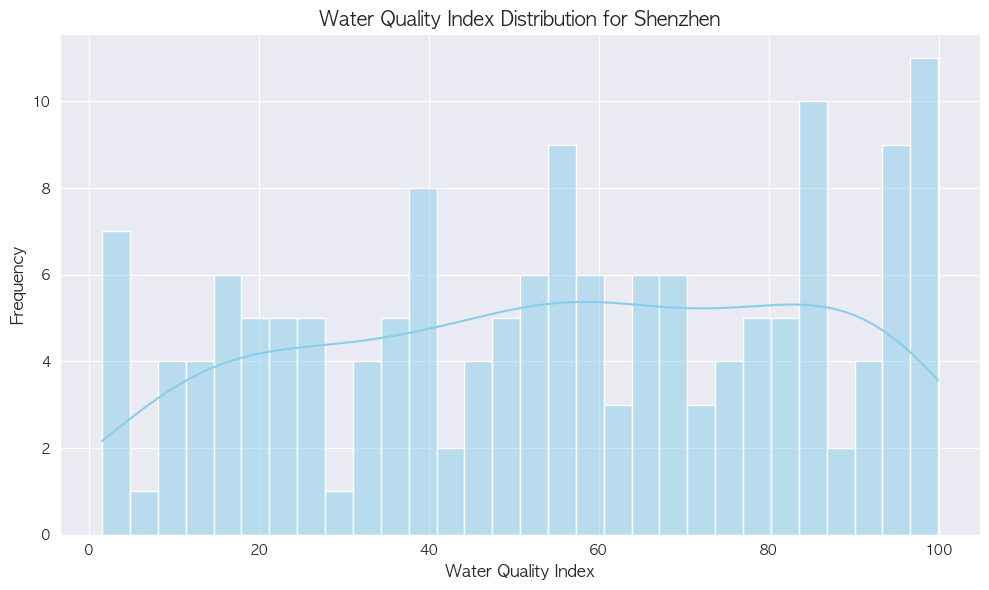

In [189]:
# Water_Quality_Index의 분포 시각화
plt.figure(figsize=(10, 6))
sns.histplot(shenzhen['Water_Quality_Index'], kde=True, color='skyblue', bins=30)

plt.title('Water Quality Index Distribution for Shenzhen', fontsize=14)
plt.xlabel('Water Quality Index', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)
plt.tight_layout()

plt.show()

/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_90437/1826268221.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Pollution_Level', y=col, data=shenzhen, palette='Blues')
/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_90437/1826268221.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Pollution_Level', y=col, data=shenzhen, palette='Blues')
/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_90437/1826268221.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Pollution_Level', y=col, data=shenzhe

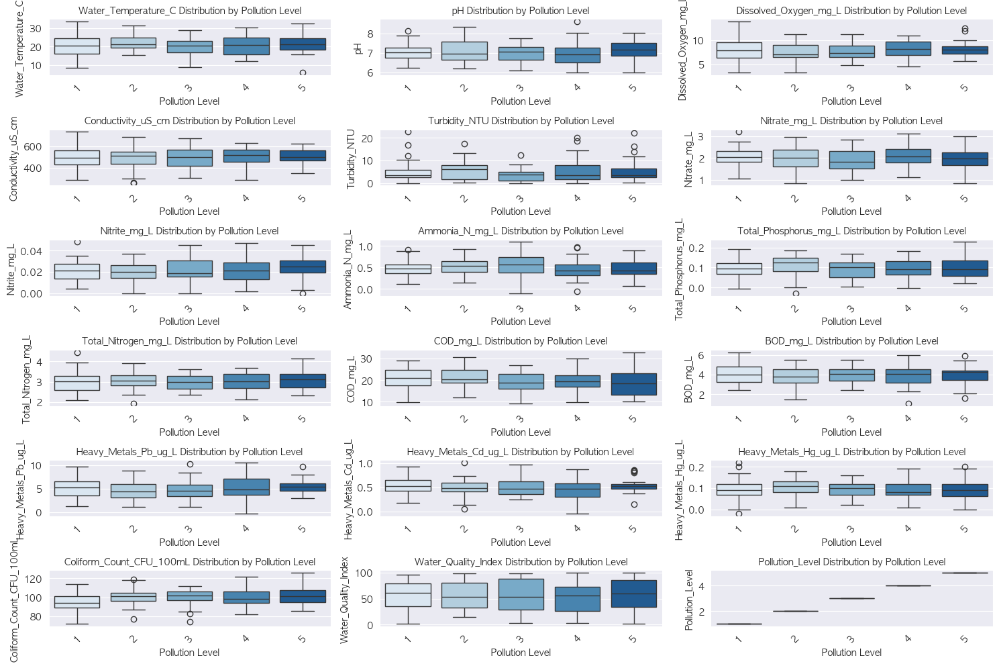

In [205]:
import matplotlib.pyplot as plt
import seaborn as sns

# 컬럼별로 분포 시각화 함수 정의
def plot_pollution_level_distribution(df, columns_to_plot):
    plt.figure(figsize=(15, 10))

    # 각 컬럼에 대해 그래프를 생성
    for i, col in enumerate(columns_to_plot):
        plt.subplot(6, 3, i+1)  # 5행 4열의 그리드로 설정
        sns.boxplot(x='Pollution_Level', y=col, data=shenzhen, palette='Blues')
        plt.title(f'{col} Distribution by Pollution Level', fontsize=10)
        plt.xlabel('Pollution Level')
        plt.ylabel(col)
        plt.xticks(rotation=45)  # X축 레이블 회전

    plt.tight_layout()
    plt.show()

# 위의 컬럼들에 대해 시각화 실행
plot_pollution_level_distribution(cwp_df, columns_to_plot)

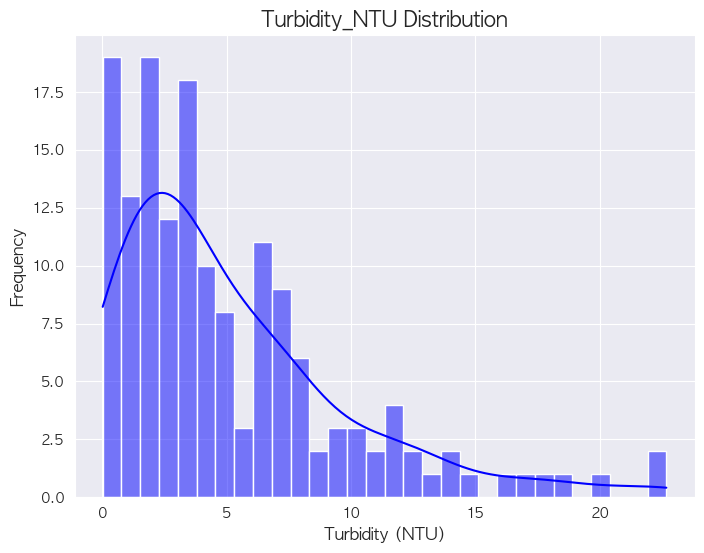

In [206]:
# Turbidity_NTU 컬럼의 히스토그램 시각화
plt.figure(figsize=(8, 6))
sns.histplot(shenzhen['Turbidity_NTU'], kde=True, color='blue', bins=30)
plt.title('Turbidity_NTU Distribution', fontsize=15)
plt.xlabel('Turbidity (NTU)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)
plt.show()

In [207]:
# 0 이하의 값을 처리하기 위해 1을 더한 뒤 로그 변환
shenzhen['Turbidity_NTU_log'] = np.log(shenzhen['Turbidity_NTU'] + 1)

# 로그 변환된 컬럼 확인
print(shenzhen[['Turbidity_NTU', 'Turbidity_NTU_log']].head())

     Turbidity_NTU  Turbidity_NTU_log
18            2.46           1.241269
25            3.39           1.479329
53            1.60           0.955511
54            1.20           0.788457
126           3.28           1.453953


/var/folders/x3/rnzg2dn97bl4ky25jynn9l0m0000gn/T/ipykernel_90437/1697651061.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shenzhen['Turbidity_NTU_log'] = np.log(shenzhen['Turbidity_NTU'] + 1)


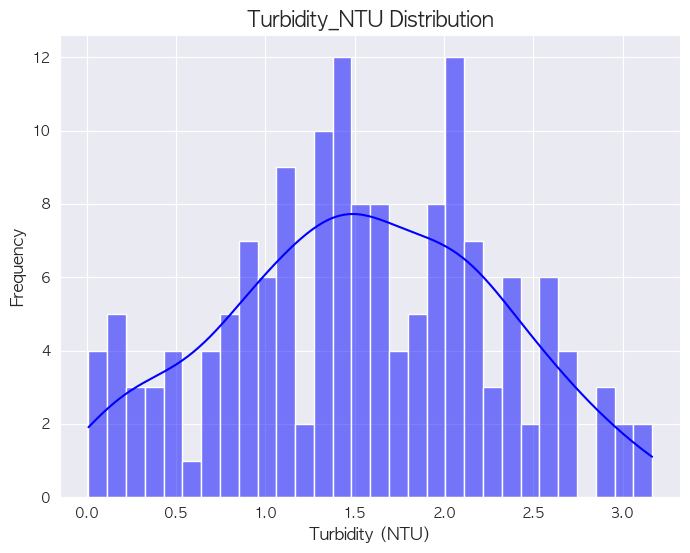

In [208]:
plt.figure(figsize=(8, 6))
sns.histplot(shenzhen['Turbidity_NTU_log'], kde=True, color='blue', bins=30)
plt.title('Turbidity_NTU Distribution', fontsize=15)
plt.xlabel('Turbidity (NTU)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)
plt.show()

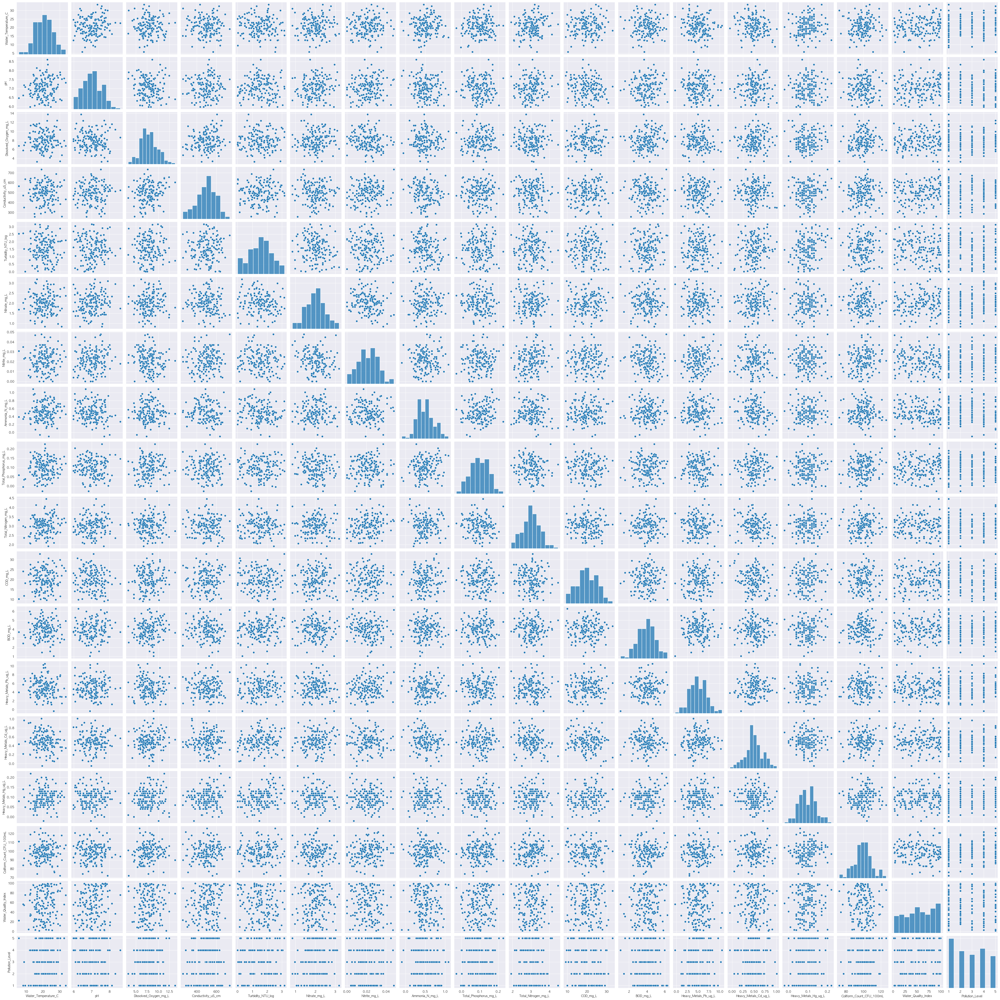

In [209]:
# 필요한 컬럼
columns_to_plot2 = [
    'Water_Temperature_C', 'pH', 'Dissolved_Oxygen_mg_L', 'Conductivity_uS_cm',
    'Turbidity_NTU_log', 'Nitrate_mg_L', 'Nitrite_mg_L', 'Ammonia_N_mg_L',
    'Total_Phosphorus_mg_L', 'Total_Nitrogen_mg_L', 'COD_mg_L', 'BOD_mg_L',
    'Heavy_Metals_Pb_ug_L', 'Heavy_Metals_Cd_ug_L', 'Heavy_Metals_Hg_ug_L',
    'Coliform_Count_CFU_100mL', 'Water_Quality_Index', 'Pollution_Level'
]
pairplot_df = shenzhen[columns_to_plot2]

sns.pairplot(pairplot_df)
plt.show()

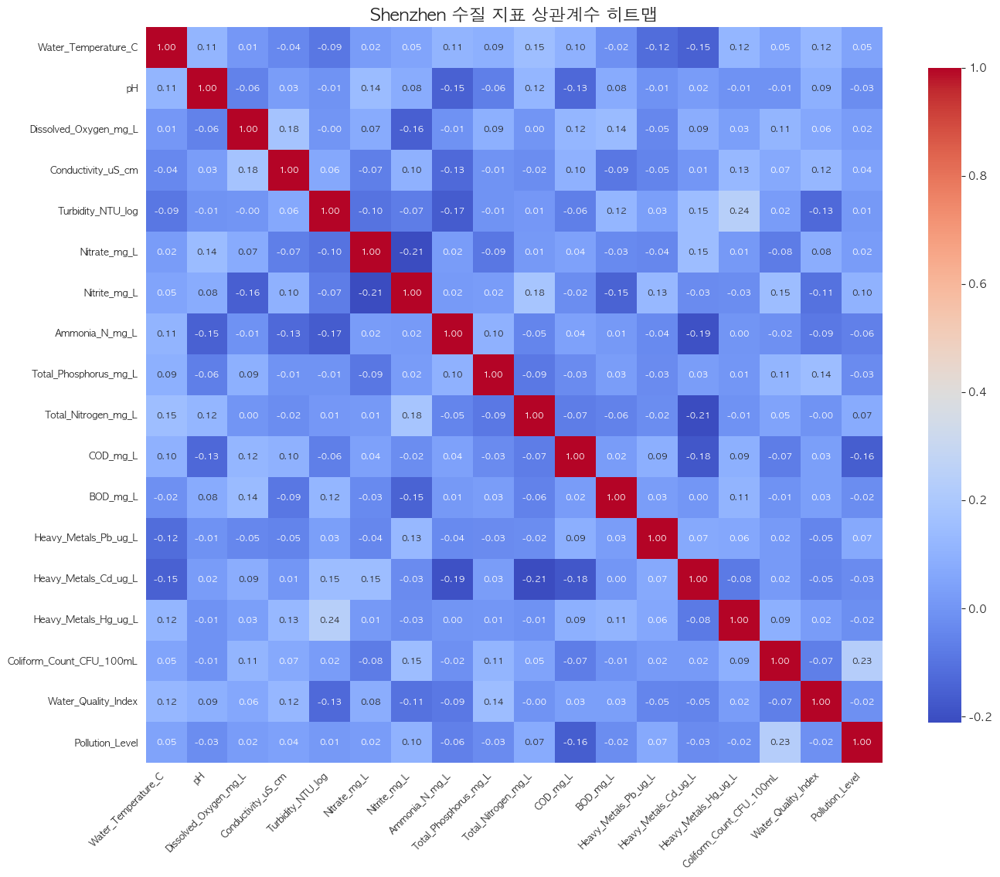

In [210]:
# 상관계수 계산
corr_matrix = pairplot_df.corr()

# 히트맵 시각화
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True,
            cbar_kws={'shrink': 0.8}, annot_kws={"size": 8})
plt.title("Shenzhen 수질 지표 상관계수 히트맵", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()

# Shenzhen vs. Suzhou

In [178]:
shen_suz = cwp_df[(cwp_df['City'] == 'Shenzhen') | (cwp_df['City'] == 'Suzhou')]
shen_suz

,Province,City,Monitoring_Station,Latitude,Longitude,Date,Water_Temperature_C,pH,Dissolved_Oxygen_mg_L,Conductivity_uS_cm,...,Hangzhou,Yichang,Shenzhen,Guangzhou,Zhengzhou,Kunming,Shanghai,Suzhou,Wuhan,Month
18,Guangdong,Shenzhen,Shenzhen_Station_1,28.866637,118.733761,2023-04-09,26.53,7.01,9.36,468.97,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-04
25,Guangdong,Shenzhen,Shenzhen_Station_9,39.361329,101.608317,2023-12-03,11.48,6.97,8.77,496.73,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-12
37,Jiangsu,Suzhou,Suzhou_Station_4,40.204767,103.719794,2023-04-02,6.52,6.97,7.54,569.62,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-04
53,Guangdong,Shenzhen,Shenzhen_Station_3,24.647425,109.881441,2023-06-08,27.83,6.97,6.89,688.12,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-06
54,Guangdong,Shenzhen,Shenzhen_Station_7,30.100151,106.011096,2023-10-05,19.77,7.12,7.52,535.21,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2968,Jiangsu,Suzhou,Suzhou_Station_1,26.158259,120.847503,2023-05-22,18.57,7.40,12.39,489.06,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-05
2976,Guangdong,Shenzhen,Shenzhen_Station_1,20.014474,119.036066,2023-01-23,24.86,7.23,8.49,463.67,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-01
2983,Guangdong,Shenzhen,Shenzhen_Station_10,43.088815,115.828398,2023-06-05,21.48,6.89,6.68,561.53,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-06
2991,Jiangsu,Suzhou,Suzhou_Station_3,37.050655,109.823435,2023-08-23,11.72,6.47,11.24,389.94,...,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,Shenzhen,2023-08


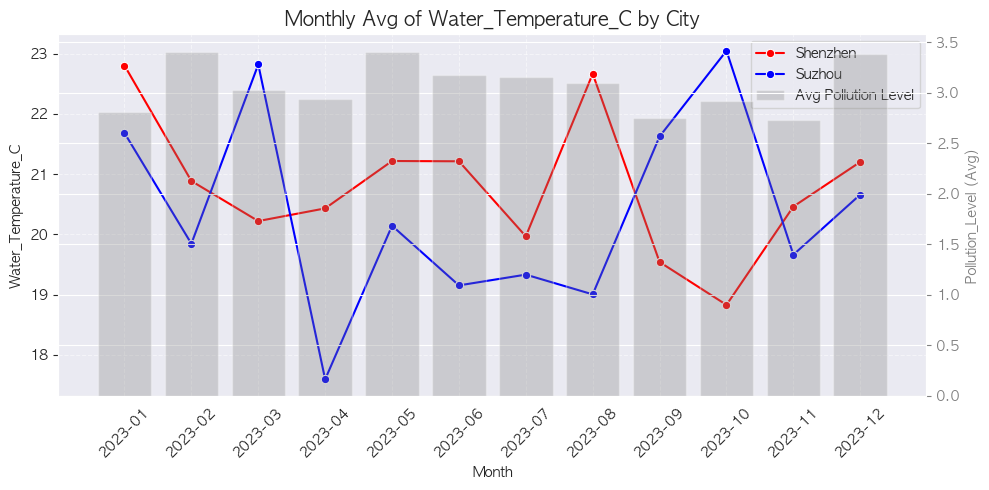

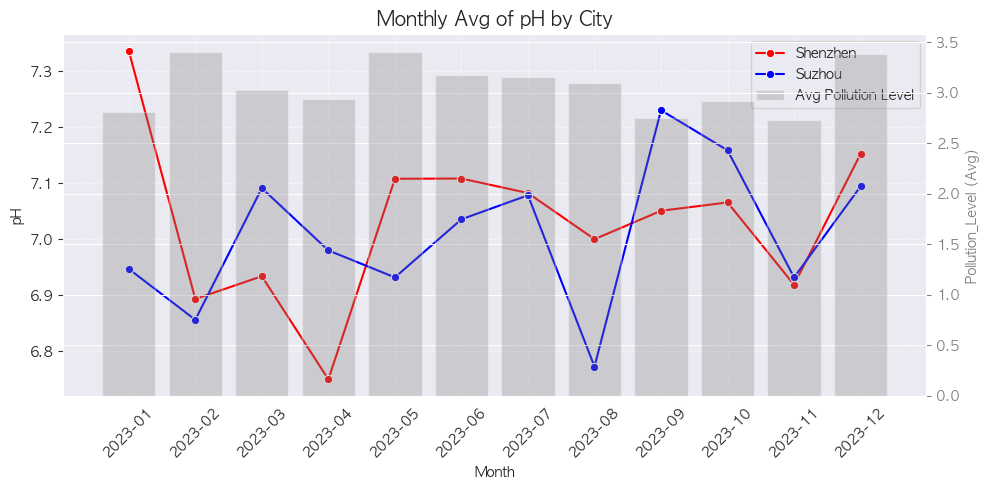

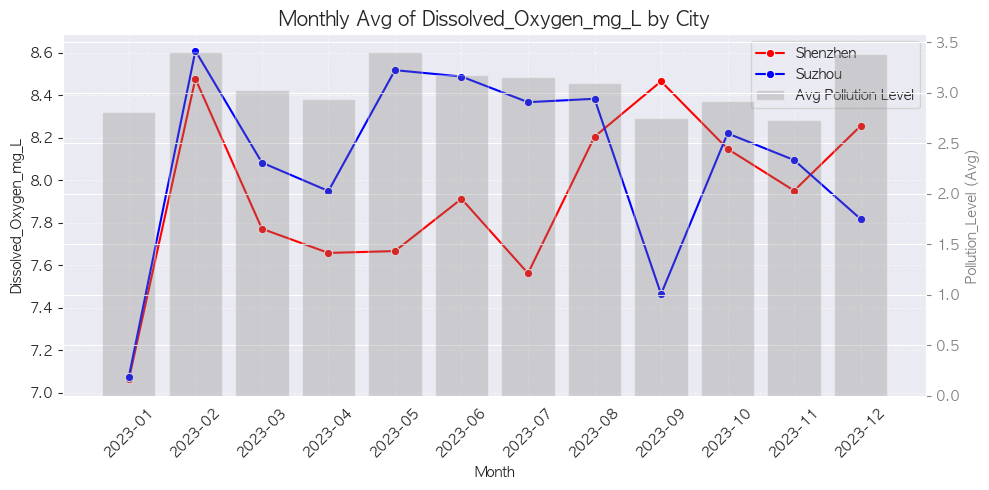

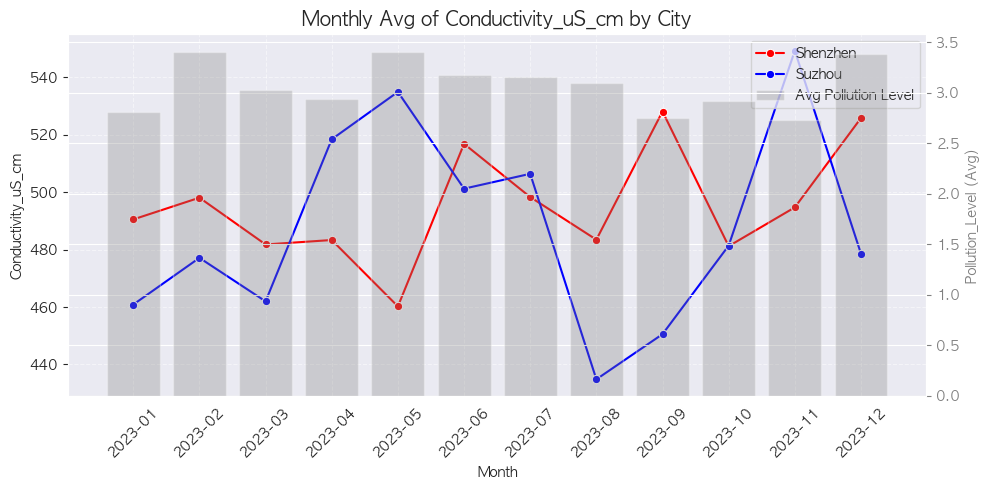

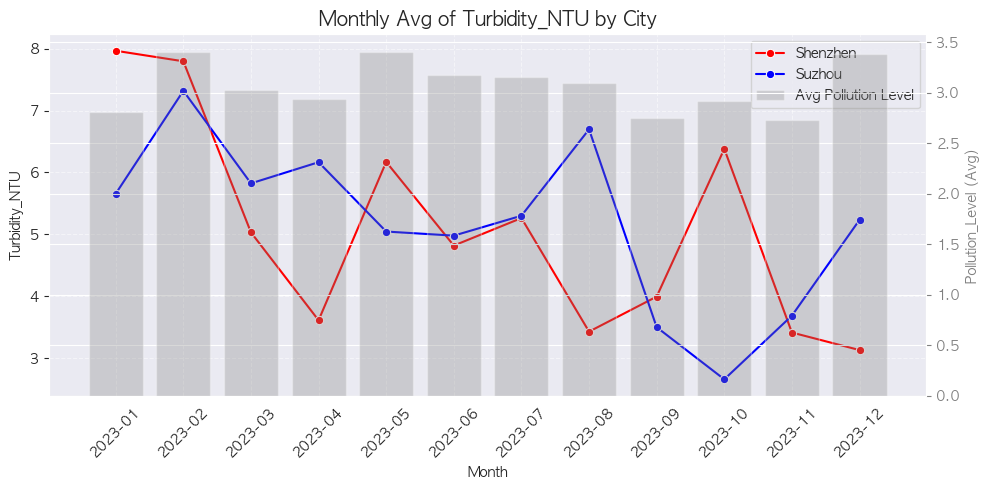

...

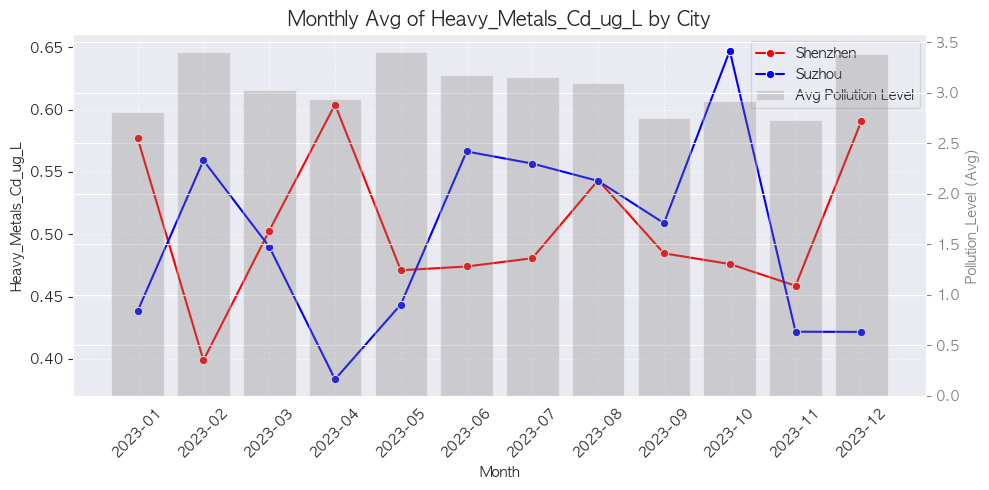

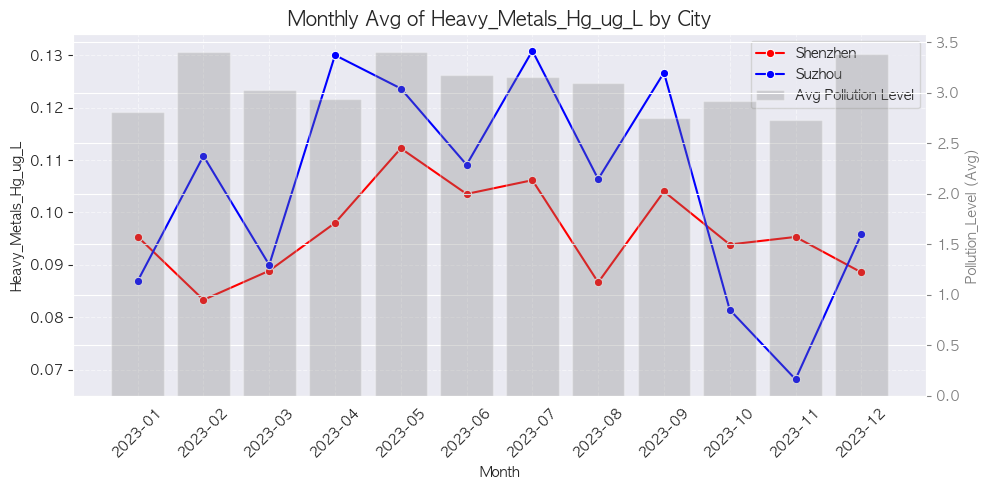

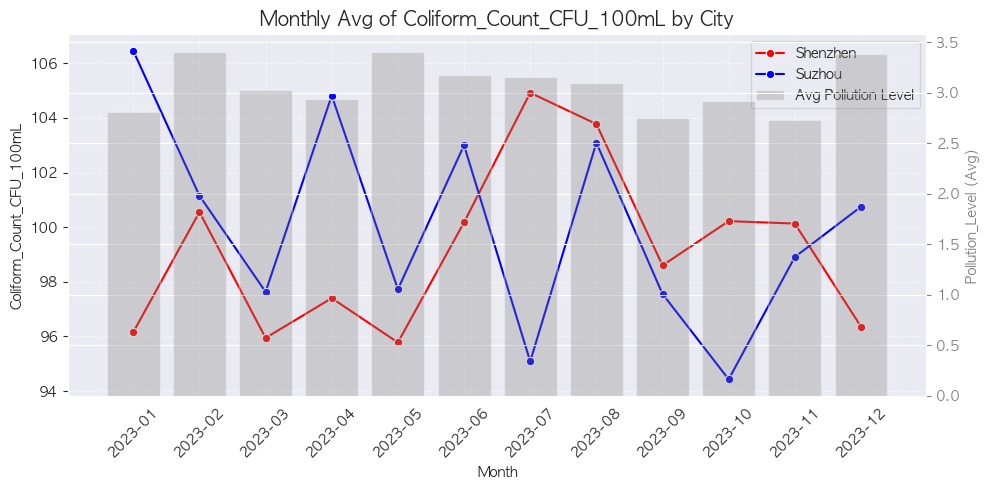

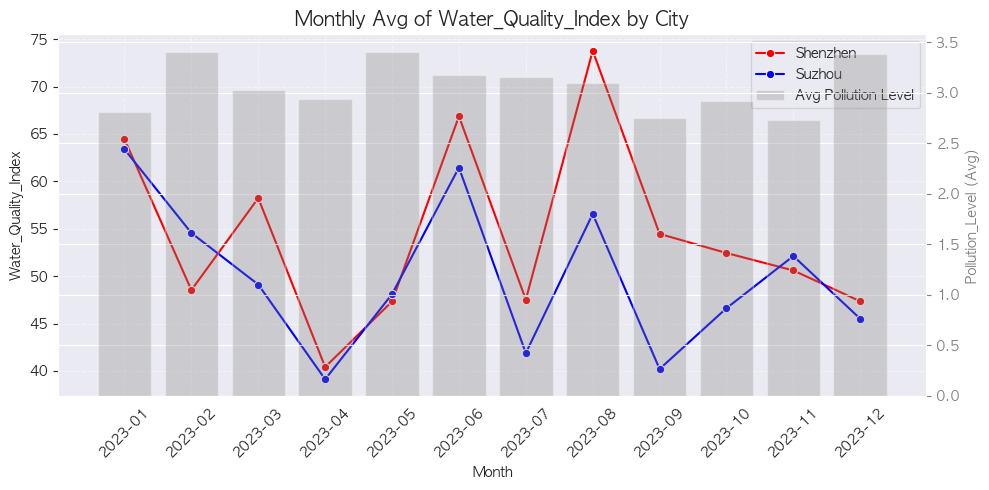

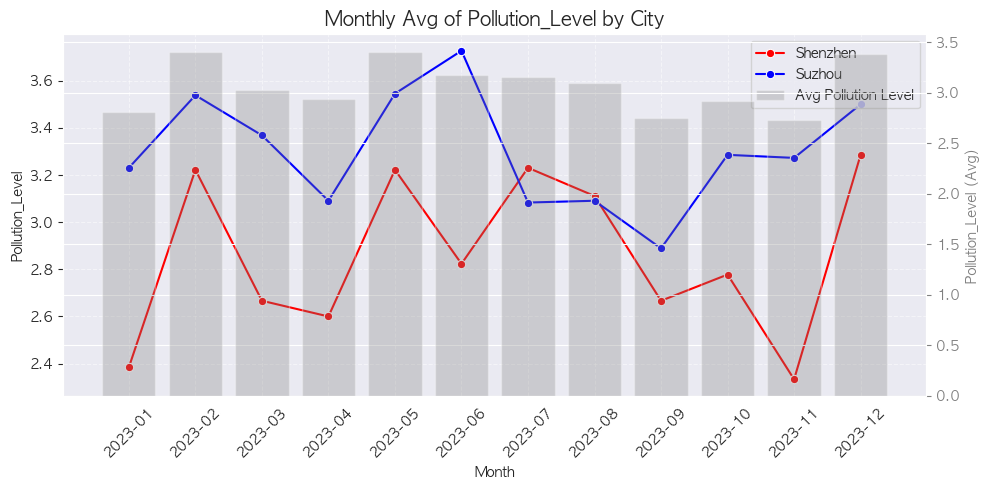

In [187]:
import matplotlib.pyplot as plt
import seaborn as sns

# 색상 매핑
city_colors = {'Shenzhen': 'red', 'Suzhou': 'blue'}

# 월별 평균 계산 (City, Month 그룹 기준)
shen_suz = cwp_df[(cwp_df['City'] == 'Shenzhen') | (cwp_df['City'] == 'Suzhou')]
monthly_avg = shen_suz.groupby(['City', 'Month'])[columns_to_plot].mean().reset_index()

# Pollution_Level의 월별 평균 계산
pollution_avg_monthly = shen_suz.groupby('Month')['Pollution_Level'].mean().reset_index()

for col in columns_to_plot:
    plt.figure(figsize=(10, 5))

    # 기본 축 (col 시각화 - 라인 그래프)
    ax1 = sns.lineplot(
        data=monthly_avg,
        x='Month',
        y=col,
        hue='City',
        palette=city_colors,
        marker='o'
    )
    ax1.set_xlabel('Month')
    ax1.set_ylabel(col)
    ax1.set_title(f'Monthly Avg of {col} by City', fontsize=14)
    ax1.tick_params(axis='x', rotation=45)
    ax1.grid(True, linestyle='--', alpha=0.5)

    # 이중 축 생성 (Pollution_Level 막대 그래프)
    ax2 = ax1.twinx()
    ax2.bar(pollution_avg_monthly['Month'], pollution_avg_monthly['Pollution_Level'],
            color='gray', alpha=0.3, label='Avg Pollution Level')  # 막대 그래프
    ax2.set_ylabel('Pollution_Level (Avg)', color='gray')
    ax2.tick_params(axis='y', colors='gray')

    # 범례 수동으로 병합
    h1, l1 = ax1.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax1.legend(h1 + h2, l1 + l2, loc='upper right')

    plt.tight_layout()
    plt.show()


# Apple Quality Classification

index: 데이터프레임의 인덱스

A_id: 항목의 ID

Size: 항목의 크기 (일정한 단위로 측정됨)

Weight: 항목의 무게 (일정한 단위로 측정됨)

Sweetness: 항목의 당도 수준 (매우 달콤함부터 매우 시큼함까지의 척도)

Crunchiness: 항목의 아삭함 수준 (매우 부드러움부터 매우 아삭함까지의 척도)

Juiciness: 항목의 즙기 수준 (매우 건조함부터 매우 즙 많음까지의 척도)

Ripeness: 항목의 숙성도 수준 (덜 익음부터 과숙까지의 척도)

Acidity: 항목의 산도 수준 (매우 낮음부터 매우 높음까지의 척도)

Quality: 항목의 전반적인 품질 평가 ("good" 또는 "bad"로 표시됨)

In [10]:
import pandas as pd
import numpy as np
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.model_selection import learning_curve
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict, StratifiedKFold
from sklearn.model_selection import learning_curve


import warnings
warnings.filterwarnings ('ignore')

sns.set(style="whitegrid")

In [22]:
df = pd.read_csv("data/apple_quality.csv")

In [23]:
df.head()

,A_id,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
0,0,-3.970049,-2.512336,5.346330,-1.012009,1.844900,0.329840,-0.491590,good
1,1,-1.195217,-2.839257,3.664059,1.588232,0.853286,0.867530,-0.722809,good
2,2,-0.292024,-1.351282,-1.738429,-0.342616,2.838636,-0.038033,2.621636,bad
3,3,-0.657196,-2.271627,1.324874,-0.097875,3.637970,-3.413761,0.790723,good
4,4,1.364217,-1.296612,-0.384658,-0.553006,3.030874,-1.303849,0.501984,good


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   A_id         4000 non-null   int64  
 1   Size         4000 non-null   float64
 2   Weight       4000 non-null   float64
 3   Sweetness    4000 non-null   float64
 4   Crunchiness  4000 non-null   float64
 5   Juiciness    4000 non-null   float64
 6   Ripeness     4000 non-null   float64
 7   Acidity      4000 non-null   float64
 8   Quality      4000 non-null   object 
dtypes: float64(7), int64(1), object(1)
memory usage: 281.4+ KB


In [25]:
df.drop('A_id', axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Size         4000 non-null   float64
 1   Weight       4000 non-null   float64
 2   Sweetness    4000 non-null   float64
 3   Crunchiness  4000 non-null   float64
 4   Juiciness    4000 non-null   float64
 5   Ripeness     4000 non-null   float64
 6   Acidity      4000 non-null   float64
 7   Quality      4000 non-null   object 
dtypes: float64(7), object(1)
memory usage: 250.1+ KB


In [27]:
df.describe()

,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity
count,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000
mean,-0.503015,-0.989547,-0.470479,0.985478,0.512118,0.498277,0.076877
std,1.928059,1.602507,1.943441,1.402757,1.930286,1.874427,2.110270
min,-7.151703,-7.149848,-6.894485,-6.055058,-5.961897,-5.864599,-7.010538
25%,-1.816765,-2.011770,-1.738425,0.062764,-0.801286,-0.771677,-1.377424
50%,-0.513703,-0.984736,-0.504758,0.998249,0.534219,0.503445,0.022609
75%,0.805526,0.030976,0.801922,1.894234,1.835976,1.766212,1.510493
max,6.406367,5.790714,6.374916,7.619852,7.364403,7.237837,7.404736


In [29]:
print(df.duplicated().sum())

0


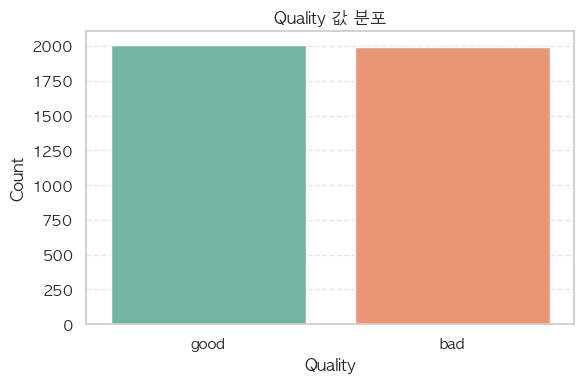

In [32]:
# 카운트 플롯 (막대그래프)
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='Quality', palette='Set2')

plt.title('Quality 값 분포')
plt.xlabel('Quality')
plt.ylabel('Count')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [61]:
df['Quality_numeric'] = df['Quality'].map({'good': 1, 'bad': 0})
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Size             4000 non-null   float64
 1   Weight           4000 non-null   float64
 2   Sweetness        4000 non-null   float64
 3   Crunchiness      4000 non-null   float64
 4   Juiciness        4000 non-null   float64
 5   Ripeness         4000 non-null   float64
 6   Acidity          4000 non-null   float64
 7   Quality          4000 non-null   object 
 8   Quality_numeric  4000 non-null   int64  
dtypes: float64(7), int64(1), object(1)
memory usage: 281.4+ KB


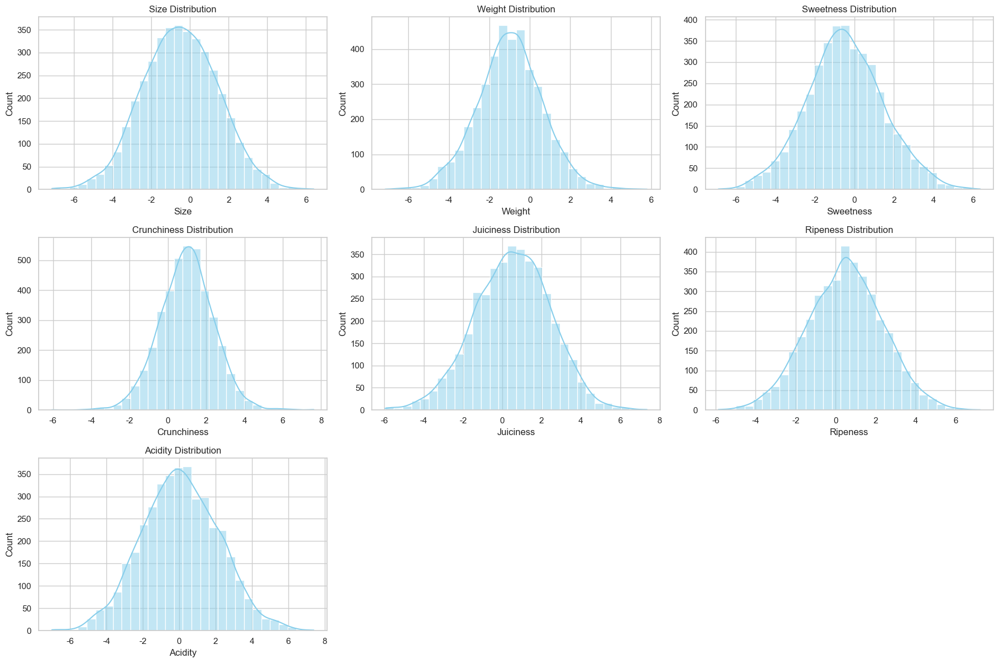

In [35]:
# 시각화할 컬럼 리스트
cols = ['Size', 'Weight', 'Sweetness', 'Crunchiness', 'Juiciness', 'Ripeness', 'Acidity']

# 그래프 스타일 설정
sns.set(style="whitegrid")

# 서브플롯 설정
plt.figure(figsize=(18, 12))
for i, col in enumerate(cols, 1):
    plt.subplot(3, 3, i)  # 3행 3열 레이아웃
    sns.histplot(data=df, x=col, kde=True, bins=30, color='skyblue')
    plt.title(f'{col} Distribution')
    plt.xlabel(col)
    plt.ylabel('Count')

plt.tight_layout()
plt.show()

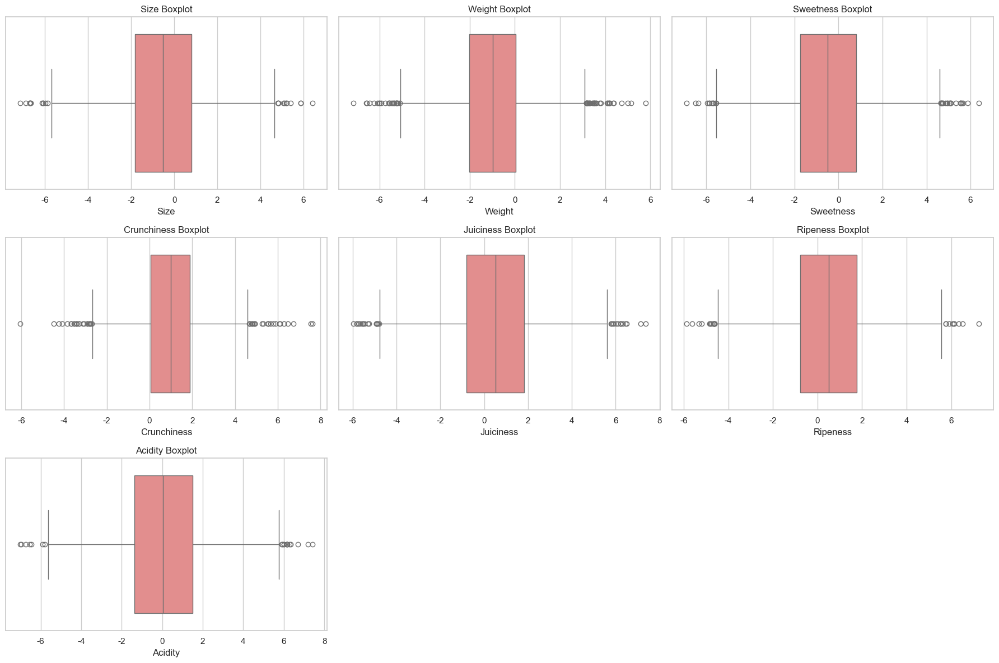

In [36]:
# 스타일 설정
sns.set(style="whitegrid")

# 서브플롯 3행 3열 (마지막 하나는 빈칸으로 남김)
plt.figure(figsize=(18, 12))
for i, col in enumerate(cols, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x=df[col], color='lightcoral')
    plt.title(f'{col} Boxplot')
    plt.xlabel(col)

# 빈칸 제거를 위해 마지막 축 숨기기
plt.subplot(3, 3, 9).axis('off')

plt.tight_layout()
plt.show()

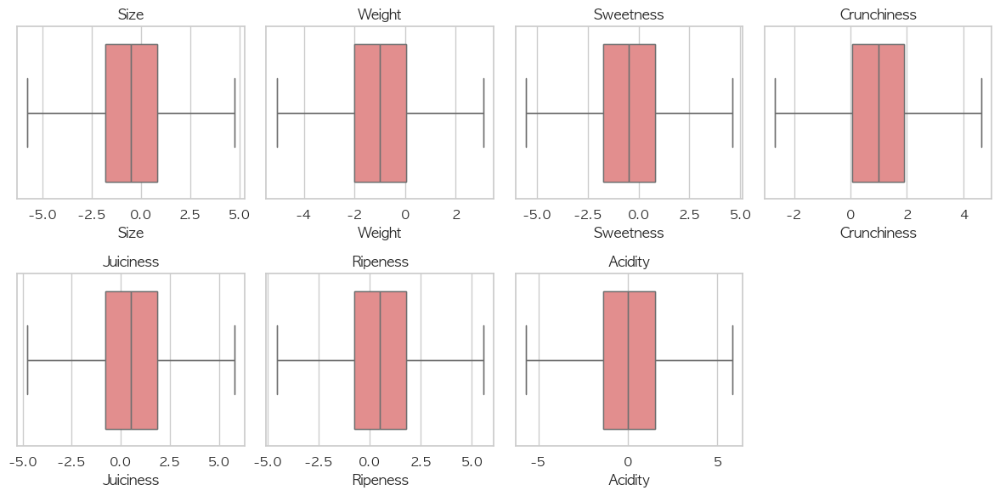

In [55]:
def winsorize_outliers_iqr(series, k=1.5):
    """
    1D pandas.Series 에 대해 IQR 기준으로 이상치를 경계값으로 대체합니다.
    series: 원본 시리즈
    k: IQR multiplier (기본 1.5)
    return: 이상치가 경계값으로 대체된 시리즈
    """
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - k * IQR
    upper_bound = Q3 + k * IQR
    return series.clip(lower=lower_bound, upper=upper_bound)

# 대상 칼럼 리스트
cols = ['Size', 'Weight', 'Sweetness', 'Crunchiness',
        'Juiciness', 'Ripeness', 'Acidity']

# 각 컬럼에 윈저화 적용
df_winsor = df.copy()
for col in cols:
    df_winsor[col] = winsorize_outliers_iqr(df_winsor[col], k=1.5)

# 결과 확인: 원본 vs 윈저화된 분포 비교
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
for i, col in enumerate(cols, 1):
    plt.subplot(2, 4, i)
    sns.boxplot(x=df[col], color='lightgray')
    sns.boxplot(x=df_winsor[col], color='lightcoral')
    plt.title(col)
plt.tight_layout()
plt.show()

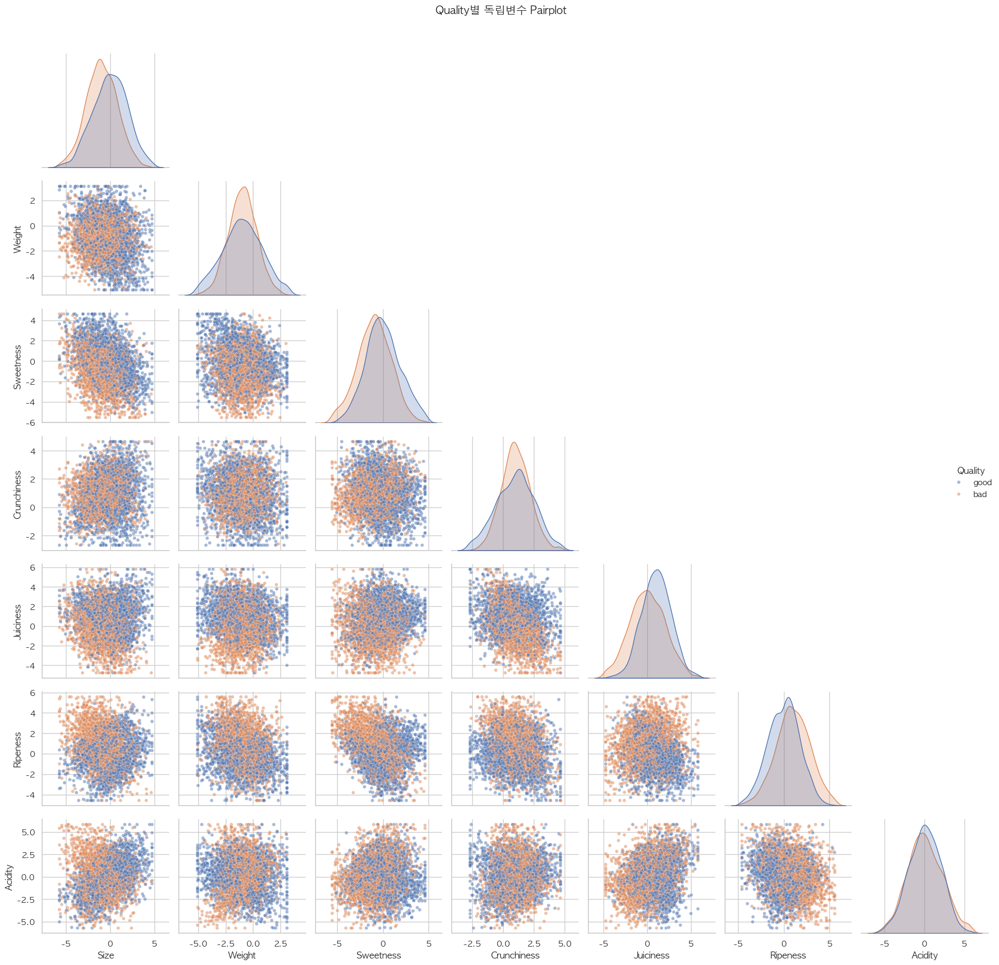

In [56]:
# 그릴 변수 리스트
cols = ['Size', 'Weight', 'Sweetness', 'Crunchiness',
        'Juiciness', 'Ripeness', 'Acidity']

# Quality와 함께 필요한 컬럼만 추출하고 결측치 제거
plot_df = df[cols + ['Quality']].dropna()

# Pairplot 그리기
sns.pairplot(
    plot_df,
    vars=cols,
    hue='Quality',
    corner=True,                # 상삼각만 그려서 공간 절약
    plot_kws={'alpha': 0.5,     # 점 투명도
              's': 20}          # 점 크기
)
plt.suptitle('Quality별 독립변수 Pairplot', y=1.02)
plt.tight_layout()
plt.show()

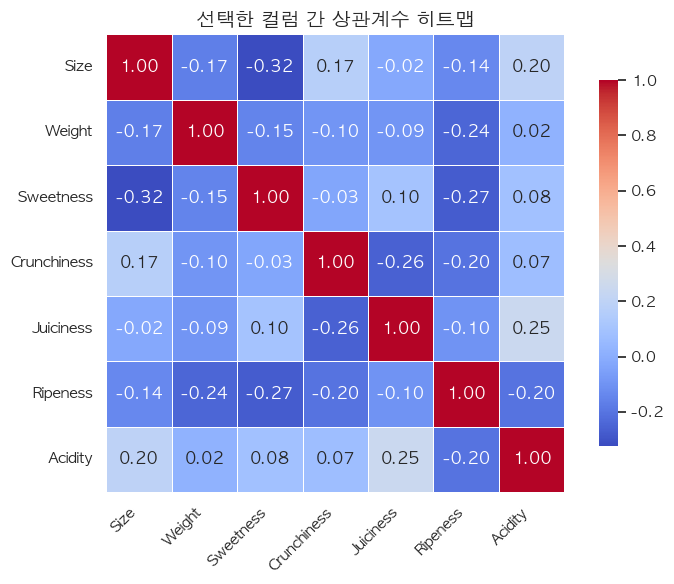

In [57]:
# 1. 상관계수 계산
corr_matrix = df[cols].corr()

# 2. 히트맵 시각화
plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_matrix,
    annot=True,       # 셀마다 상관계수 값 표시
    fmt=".2f",        # 소수점 둘째 자리까지
    cmap="coolwarm",  # 음수는 파랑, 양수는 빨강 계열
    square=True,      # 셀을 정사각형으로
    cbar_kws={"shrink": .8},  # 컬러바 크기 조정
    linewidths=0.5    # 셀 경계선 두께
)

plt.title("선택한 컬럼 간 상관계수 히트맵", fontsize=14)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [62]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

X = df.drop(['Quality_numeric', 'Quality'], axis=1)
y = df['Quality_numeric']

# X: 독립변수(DataFrame), y: Quality_numeric (0/1)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [63]:
# feature_names: X_train의 컬럼 리스트
feature_names = X_train.columns

# model.coef_는 클래스별 계수를 담은 2D 배열 (이진 분류면 shape=(1, n_features))
coefs = model.coef_[0]

# 데이터프레임으로 정리
coef_df = pd.DataFrame({
    'feature': feature_names,
    'coefficient': coefs
}).sort_values('coefficient', key=abs, ascending=False)

print(coef_df)

       feature  coefficient
0         Size     0.651494
2    Sweetness     0.589096
4    Juiciness     0.428940
6      Acidity    -0.306975
1       Weight     0.256563
5     Ripeness    -0.142075
3  Crunchiness     0.004092


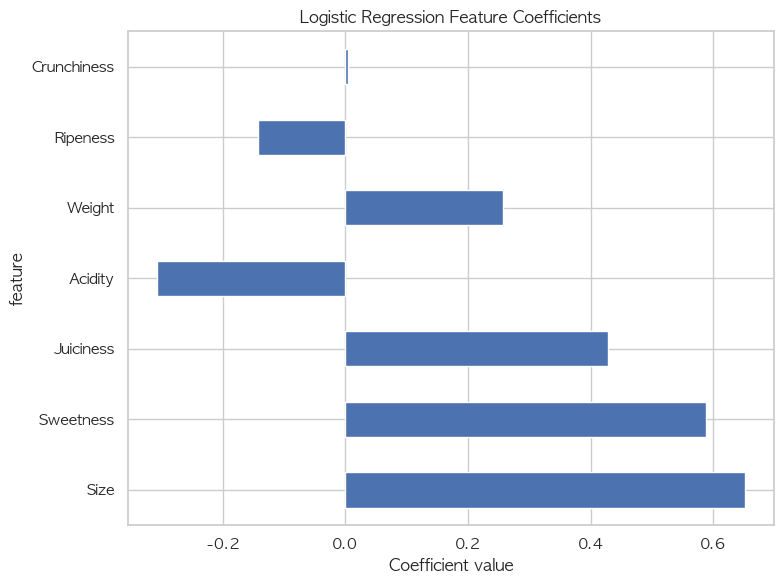

In [64]:
plt.figure(figsize=(8, 6))
coef_df.set_index('feature')['coefficient'].plot.barh()
plt.title('Logistic Regression Feature Coefficients')
plt.xlabel('Coefficient value')
plt.tight_layout()
plt.show()